#  Comportamiento check in New york:


In [1]:
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import powerlaw
from sklearn.metrics import silhouette_score
from tslearn.clustering import TimeSeriesKMeans
from tslearn.preprocessing import TimeSeriesScalerMeanVariance
from tslearn.clustering import TimeSeriesKMeans
from tslearn.preprocessing import TimeSeriesScalerMeanVariance
from sklearn.cluster import DBSCAN
from sklearn.metrics.pairwise import pairwise_distances
from tslearn.metrics import dtw
from tslearn.clustering import KShape
from scipy.spatial.distance import squareform
from scipy.cluster.hierarchy import linkage, dendrogram
from scipy.cluster.hierarchy import fcluster
from tslearn.metrics import dtw
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans
from collections import Counter
import random
from sklearn.cluster import AgglomerativeClustering
from scipy.spatial.distance import pdist
from matplotlib.font_manager import FontProperties
import matplotlib.lines as mlines

In [2]:
#Powerlaw: A Python Package for Analysis of Heavy-Tailed Distributions
# Initialize an empty list to store the data
data = []

# Open the text file for reading with the specified encoding
with open(r'C:\Users\oscar\OneDrive - Universidad Nacional de Colombia\Tesis\Comportamineto humano\Check-in-NY\dataset_tsmc2014\dataset_TSMC2014_NYC.txt', 'r', encoding='latin-1') as file:
    # Read each line in the file
    for line in file:
        # Split the line into columns based on the tab delimiter
        columns = line.strip().split('\t')
        
        # Append the columns to the data list
        data.append(columns)

# Define the column names
column_names = ['User ID', 'Venue ID', 'Venue category ID', 'Venue category name', 'Latitude', 'Longitude', 'Timezone offset in minutes', 'UTC time']

# Create a DataFrame from the data list
df = pd.DataFrame(data, columns=column_names)

# Optionally, convert columns to appropriate data types
df['Latitude'] = df['Latitude'].astype(float)
df['Longitude'] = df['Longitude'].astype(float)
df['Timezone offset in minutes'] = df['Timezone offset in minutes'].astype(int)

# Display the DataFrame
df.head()


,User ID,Venue ID,Venue category ID,Venue category name,Latitude,Longitude,Timezone offset in minutes,UTC time
0,470,49bbd6c0f964a520f4531fe3,4bf58dd8d48988d127951735,Arts & Crafts Store,40.719810,-74.002581,-240,Tue Apr 03 18:00:09 +0000 2012
1,979,4a43c0aef964a520c6a61fe3,4bf58dd8d48988d1df941735,Bridge,40.606800,-74.044170,-240,Tue Apr 03 18:00:25 +0000 2012
2,69,4c5cc7b485a1e21e00d35711,4bf58dd8d48988d103941735,Home (private),40.716162,-73.883070,-240,Tue Apr 03 18:02:24 +0000 2012
3,395,4bc7086715a7ef3bef9878da,4bf58dd8d48988d104941735,Medical Center,40.745164,-73.982519,-240,Tue Apr 03 18:02:41 +0000 2012
4,87,4cf2c5321d18a143951b5cec,4bf58dd8d48988d1cb941735,Food Truck,40.740104,-73.989658,-240,Tue Apr 03 18:03:00 +0000 2012


In [3]:
print('hay',df['User ID'].unique().size, 'usuarios únicos')
def get_most_entries_user(df):
    user_counts = df['User ID'].value_counts()
    most_entries_user = user_counts.idxmax()
    most_entries_count = user_counts.max()
    return most_entries_user, most_entries_count

most_entries_user, most_entries_count = get_most_entries_user(df)
print(f"The user ID with the most entries is {most_entries_user} with {most_entries_count} entries.")


hay 1083 usuarios únicos
The user ID with the most entries is 293 with 2697 entries.


## 1)Histograma semanal usuario 293

#### Primero intentamos el histograma de la semana para una persona

In [4]:
user_293 = df[df['User ID'] == '293'][['User ID', 'UTC time']]
user_293['UTC time'] = pd.to_datetime(user_293['UTC time'])
user_293 = user_293.sort_values('UTC time')#Esta organizado por este tiempo
user_293['Time Difference τ'] = user_293['UTC time'].diff()


user_293.head()

C:\Users\oscar\AppData\Local\Temp\ipykernel_14476\2112416221.py:2: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  user_293['UTC time'] = pd.to_datetime(user_293['UTC time'])


,User ID,UTC time,Time Difference τ
690,293,2012-04-03 23:56:43+00:00,NaT
760,293,2012-04-04 00:19:13+00:00,0 days 00:22:30
763,293,2012-04-04 00:19:44+00:00,0 days 00:00:31
766,293,2012-04-04 00:21:12+00:00,0 days 00:01:28
1121,293,2012-04-04 04:53:06+00:00,0 days 04:31:54


In [5]:
user_293['DAY_OF_THE_WEEK'] = user_293['UTC time'].dt.day_name()
user_293.head()

,User ID,UTC time,Time Difference τ,DAY_OF_THE_WEEK
690,293,2012-04-03 23:56:43+00:00,NaT,Tuesday
760,293,2012-04-04 00:19:13+00:00,0 days 00:22:30,Wednesday
763,293,2012-04-04 00:19:44+00:00,0 days 00:00:31,Wednesday
766,293,2012-04-04 00:21:12+00:00,0 days 00:01:28,Wednesday
1121,293,2012-04-04 04:53:06+00:00,0 days 04:31:54,Wednesday


### 2.1)Sacando un histograma para el lunes

C:\Users\oscar\AppData\Local\Temp\ipykernel_14476\2227143012.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  user_293_monday['Hour'] = user_293_monday['UTC time'].dt.hour + user_293_monday['UTC time'].dt.minute / 60#para incluir los minutos


23.983333333333334 0.2


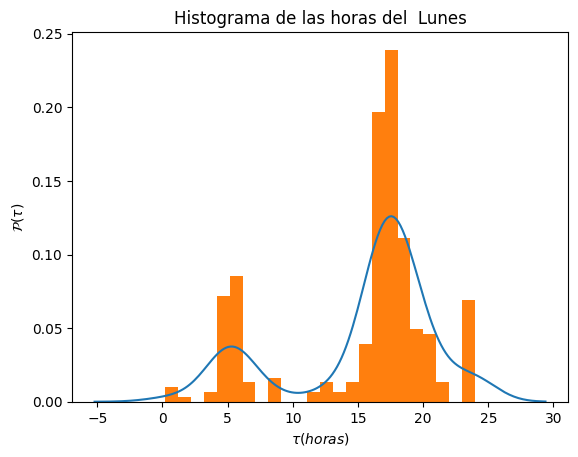

In [6]:

user_293_monday = user_293[user_293['DAY_OF_THE_WEEK'] == 'Monday']

# Create una columna que me de las horas dadas por utc time

user_293_monday['Hour'] = user_293_monday['UTC time'].dt.hour + user_293_monday['UTC time'].dt.minute / 60#para incluir los minutos
user_293_monday.head()

# El histograma
tau_monday= user_293_monday['Hour']
print(max(tau_monday), min(tau_monday))
# hISTOGRAM OF tau_monday
sns.kdeplot(tau_monday)
plt.hist(tau_monday, bins=24, density=True)#toma la frecuenecia en escala log, tenemos binds lineales
plt.xlabel(r'$\tau(horas)$')
plt.ylabel(r'$\mathcal{P}(\tau)$') 
plt.title('Histograma de las horas del  Lunes')
plt.show()



### 2.2)El histograma de la semana 

In [7]:
# Concatenate the data from all days
user_293_all_days = pd.concat([user_293_monday, user_293[user_293['DAY_OF_THE_WEEK'] != 'Monday']])

# Create a column that represents the hours of the day
user_293_all_days['Hour'] = user_293_all_days['UTC time'].dt.dayofweek * 24 + user_293_all_days['UTC time'].dt.hour + user_293_all_days['UTC time'].dt.minute / 60
user_293_all_days.head()    

# Create a column that represents the hours of the day

user_293_all_days.head(1000)


,User ID,UTC time,Time Difference τ,DAY_OF_THE_WEEK,Hour
6187,293,2012-04-09 11:57:14+00:00,0 days 16:25:52,Monday,11.950000
6188,293,2012-04-09 11:57:30+00:00,0 days 00:00:16,Monday,11.950000
6282,293,2012-04-09 12:32:09+00:00,0 days 00:34:39,Monday,12.533333
6346,293,2012-04-09 12:56:28+00:00,0 days 00:24:19,Monday,12.933333
6709,293,2012-04-09 16:26:07+00:00,0 days 03:29:39,Monday,16.433333
...,...,...,...,...,...
119868,293,2012-07-03 17:57:41+00:00,0 days 00:01:27,Tuesday,41.950000
120345,293,2012-07-03 23:44:07+00:00,0 days 05:46:26,Tuesday,47.733333
120380,293,2012-07-04 00:07:35+00:00,0 days 00:23:28,Wednesday,48.116667
120387,293,2012-07-04 00:09:48+00:00,0 days 00:02:13,Wednesday,48.150000


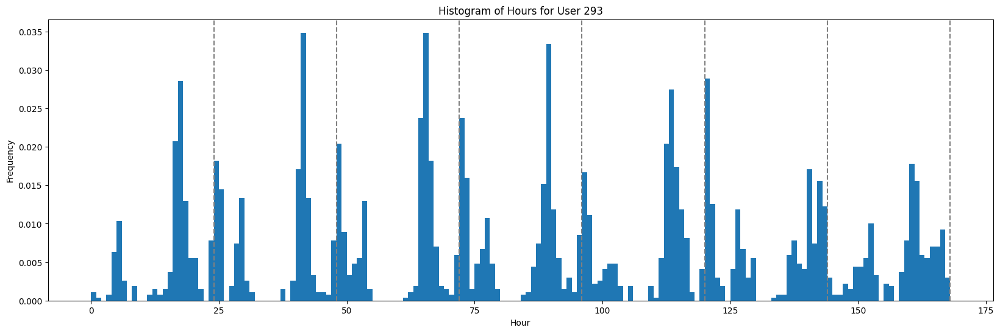

In [8]:
# Plot the histogram

plt.figure(figsize=(20, 6))# Adjust the width and height as needed
#sns.kdeplot(user_293_all_days['Hour'])
plt.hist(user_293_all_days['Hour'], bins=np.arange(0,169,1), density=True)
plt.xlabel('Hour')
plt.ylabel('Frequency')
plt.title('Histogram of Hours for User 293')

# Plot vertical lines at specific hours

hours = [24, 48, 72, 96, 120, 144, 168]
for hour in hours:
    plt.axvline(hour, color='gray', linestyle='--')


plt.show()

#Faltaria ver que se puede representar esa densidad


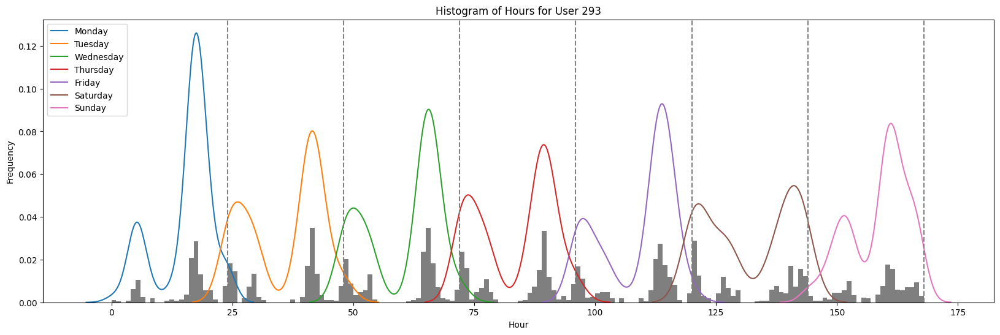

In [9]:
# Plot the histogram

plt.figure(figsize=(20, 6))

# Iterate over each day of the week
for day in user_293_all_days['DAY_OF_THE_WEEK'].unique():
    # Filter the data for the current day
    data = user_293_all_days[user_293_all_days['DAY_OF_THE_WEEK'] == day]['Hour']
    
    # Plot the KDE plot for the current day
    sns.kdeplot(data, label=day)

# Plot the histogram
plt.hist(user_293_all_days['Hour'], bins=np.arange(0,169,1), density=True)
plt.xlabel('Hour')
plt.ylabel('Frequency')
plt.title('Histogram of Hours for User 293')

# Plot vertical lines at specific hours

hours = [24, 48, 72, 96, 120, 144, 168]
for hour in hours:
    plt.axvline(hour, color='gray', linestyle='--')

plt.legend()
plt.show()

#MAYBE TRY THIS The image below illustrate my question. I added the blue line using a KernelDensity 
# (KernelDensity(kernel='Gaussian', bandwidth=1.5).fit(price,sample_weight=quantity)

## 2)Histograma semanal de cualquier usuario:

In [10]:
""" Va a sacar la grafica de todos los usuarios

usuarios=df[['User ID', 'UTC time']] 

# Iterate over each unique user ID
for user_id in usuarios['User ID'].unique():
    # Select the data for the current user
    user_data = usuarios[usuarios['User ID'] == user_id]
    user_data['UTC time'] = pd.to_datetime(user_data['UTC time'])
    user_data = user_data.sort_values('UTC time')
    user_data['DAY_OF_THE_WEEK'] = user_data['UTC time'].dt.day_name()
    user_data_monday = user_data[user_data['DAY_OF_THE_WEEK'] == 'Monday']

    # Create a column that represents the hours of the day
    user_data_monday['Hour'] = user_data_monday['UTC time'].dt.hour + user_data_monday['UTC time'].dt.minute / 60

    # Plot the histogram for Monday
    tau_monday = user_data_monday['Hour']
    print(f"User ID: {user_id}")
    print(f"Max Hour on Monday: {max(tau_monday)}")
    print(f"Min Hour on Monday: {min(tau_monday)}")
    sns.kdeplot(tau_monday)
    plt.hist(tau_monday, bins=24, density=True)
    plt.xlabel('Hour')
    plt.ylabel('Frequency') 
    plt.title(f'Histogram of Hours on Monday for User {user_id}')
    plt.show()

    # Concatenate the data from all days
    user_data_all_days = pd.concat([user_data_monday, user_data[user_data['DAY_OF_THE_WEEK'] != 'Monday']])

    # Create a column that represents the hours of the day
    user_data_all_days['Hour'] = user_data_all_days['UTC time'].dt.dayofweek * 24 + user_data_all_days['UTC time'].dt.hour + user_data_all_days['UTC time'].dt.minute / 60

    # Plot the histogram for all days
    plt.figure(figsize=(20, 6))
    plt.hist(user_data_all_days['Hour'], bins=168, density=True)
    plt.xlabel('Hour')
    plt.ylabel('Frequency')
    plt.title(f'Histogram of Hours for User {user_id}')

    # Plot vertical lines at specific hours
    hours = [24, 48, 72, 96, 120, 144, 168]
    for hour in hours:
        plt.axvline(hour, color='gray', linestyle='--')

    plt.show()
    """ 


' Va a sacar la grafica de todos los usuarios\n\nusuarios=df[[\'User ID\', \'UTC time\']] \n\n# Iterate over each unique user ID\nfor user_id in usuarios[\'User ID\'].unique():\n    # Select the data for the current user\n    user_data = usuarios[usuarios[\'User ID\'] == user_id]\n    user_data[\'UTC time\'] = pd.to_datetime(user_data[\'UTC time\'])\n    user_data = user_data.sort_values(\'UTC time\')\n    user_data[\'DAY_OF_THE_WEEK\'] = user_data[\'UTC time\'].dt.day_name()\n    user_data_monday = user_data[user_data[\'DAY_OF_THE_WEEK\'] == \'Monday\']\n\n    # Create a column that represents the hours of the day\n    user_data_monday[\'Hour\'] = user_data_monday[\'UTC time\'].dt.hour + user_data_monday[\'UTC time\'].dt.minute / 60\n\n    # Plot the histogram for Monday\n    tau_monday = user_data_monday[\'Hour\']\n    print(f"User ID: {user_id}")\n    print(f"Max Hour on Monday: {max(tau_monday)}")\n    print(f"Min Hour on Monday: {min(tau_monday)}")\n    sns.kdeplot(tau_monday)\n  

### 3.1)Creamos un diccionario de todos

In [11]:
usuarios=df[['User ID', 'UTC time']] 


# Create an empty dictionary
hour_dict = {}#SE GUARDARAN LOS VALORES DE LAS HORAS DE CADA USUARIO PARA LOS DIAS DE LA SEMANA SOLAMENTE VERIFICANDO LOS DIAS DE LA SEMANA 

# Iterate over each unique user ID
for user_id in usuarios['User ID'].unique():
    # Select the data for the current user
    user_data = usuarios[usuarios['User ID'] == user_id]
    user_data['UTC time'] = pd.to_datetime(user_data['UTC time'])
    user_data = user_data.sort_values('UTC time')
    user_data['DAY_OF_THE_WEEK'] = user_data['UTC time'].dt.day_name()
    user_data_monday = user_data[user_data['DAY_OF_THE_WEEK'] == 'Monday']

    # Create a column that represents the hours of the day
    user_data_monday['Hour'] = user_data_monday['UTC time'].dt.hour + user_data_monday['UTC time'].dt.minute / 60

    # Concatenate the data from all days
    user_data_all_days = pd.concat([user_data_monday, user_data[user_data['DAY_OF_THE_WEEK'] != 'Monday']])

    # Create a column that represents the hours of the day
    user_data_all_days['Hour'] = user_data_all_days['UTC time'].dt.dayofweek * 24 + user_data_all_days['UTC time'].dt.hour + user_data_all_days['UTC time'].dt.minute / 60

    # Save the array as the value of the dictionary with the key being the user ID
    hour_dict[user_id] = user_data_all_days['Hour'].values

# Print the dictionary
#print(hour_dict)

C:\Users\oscar\AppData\Local\Temp\ipykernel_14476\1051623935.py:11: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  user_data['UTC time'] = pd.to_datetime(user_data['UTC time'])
C:\Users\oscar\AppData\Local\Temp\ipykernel_14476\1051623935.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  user_data['UTC time'] = pd.to_datetime(user_data['UTC time'])
C:\Users\oscar\AppData\Local\Temp\ipykernel_14476\1051623935.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://p

C:\Users\oscar\AppData\Local\Temp\ipykernel_14476\1051623935.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  user_data['UTC time'] = pd.to_datetime(user_data['UTC time'])
C:\Users\oscar\AppData\Local\Temp\ipykernel_14476\1051623935.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  user_data_monday['Hour'] = user_data_monday['UTC time'].dt.hour + user_data_monday['UTC time'].dt.minute / 60
C:\Users\oscar\AppData\Local\Temp\ipykernel_14476\1051623935.py:11: UserWarning: Could not infer format, so each

### 3.2)Funcion para graficar cada usuario


In [12]:
def plot_user_hours(user_id,label=''):
    plt.figure(figsize=(20, 6))
    plt.hist(hour_dict[user_id], bins=168, density=True)
    font = {'family': 'Times New Roman', 'size': 17, 'weight': 'normal'}
    plt.xlabel(r'$\tau$(horas)', fontdict=font)
    plt.ylabel(r'$\mathcal{P}(\tau)$',fontdict=font)
    plt.title(f'Histograma para el usuario {user_id} y cluster {label}',fontdict=font)

    hours = [24, 48, 72, 96, 120, 144, 168]
    for hour in hours:
        plt.axvline(hour, color='gray', linestyle='--')
    plt.xlim(0, 168) 
    plt.xticks(hours, fontsize=12)
    plt.yticks(fontsize=12)
    plt.show()

In [13]:
def plot_user_hours_fre(user_id,label=''):
    font = {'family': 'Times New Roman', 'size': 20, 'weight': 'normal'}
    plt.figure(figsize=(20, 6))
    values, bins = np.histogram(hour_dict[user_id], bins=168, density=True)
    plt.plot(bins[1::], values, label='Frecuencia')
    plt.xlabel(r'$\tau$(horas)', fontdict=font)
    plt.ylabel(r'$\mathcal{P}(\tau)$',fontdict=font)
    plt.title(f'Histograma para el usuario {user_id}', fontdict=font)

    hours = [24, 48, 72, 96, 120, 144, 168]
    for hour in hours:
        plt.axvline(hour, color='gray', linestyle='--')
    plt.xlim(0, 168) 
    plt.xticks(hours, fontsize=16)
    plt.yticks(fontsize=16)
    plt.show()

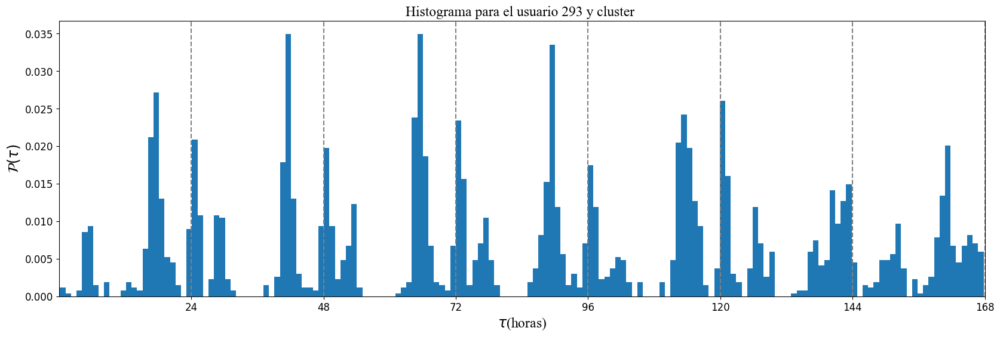

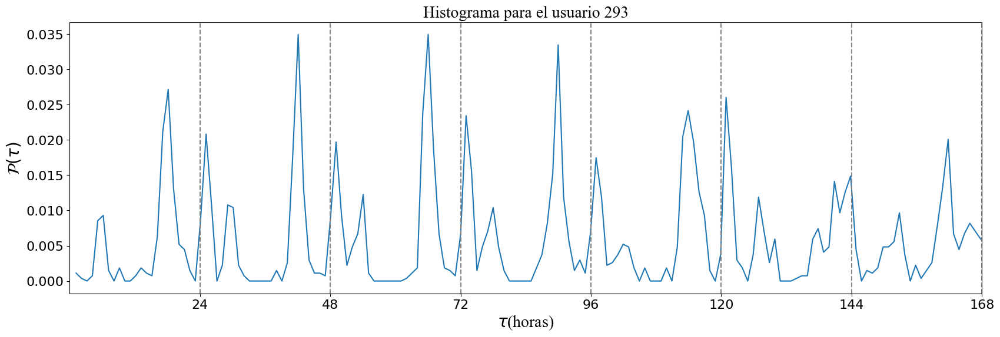

In [14]:
plot_user_hours('293')
plot_user_hours_fre('293')

In [15]:
hour_dict
#del hour_dict['587']



{'470': array([ 18.01666667,  18.        ,   1.03333333,   1.73333333,
          7.16666667,   7.16666667,  11.76666667,  12.58333333,
         12.6       ,  12.61666667,  12.65      ,  12.65      ,
         12.66666667,  18.        ,  18.        ,  18.        ,
         42.        ,  47.6       ,  47.76666667,  47.78333333,
         47.78333333,  47.8       ,  47.8       ,  47.85      ,
         47.86666667,  47.86666667,  48.        ,  48.16666667,
         48.2       ,  48.21666667,  48.21666667,  48.23333333,
         48.3       ,  48.31666667,  50.26666667,  50.28333333,
         50.28333333,  50.3       ,  50.3       ,  50.31666667,
         50.33333333,  53.03333333,  53.05      ,  53.3       ,
         53.78333333,  66.        ,  80.16666667,  80.18333333,
         80.18333333,  80.2       ,  80.21666667,  80.65      ,
         80.65      ,  80.86666667,  80.88333333,  80.9       ,
         80.91666667,  80.91666667,  81.        ,  81.03333333,
         81.05      , 147.45     

## 3) Clustering con las frecuencias:

### 3.1) Creamos un diccionario que va a tener las freuencias 

In [16]:
#Hacemos otro diccionario que tenga la frecuencia del histograma de cada usuario para usar esos datos en el clustering
hour_freq_dict = {} #SE GUARDARAN LOS VALORES DE LAS FRECUENCIAS DE LAS HORAS DE CADA USUARIO PARA LOS DIAS DE LA SEMANA SOLAMENTE VERIFICANDO LOS DIAS DE LA SEMANA

# Get the frequencies and bin edges for each array in hour_dict

for user, array in hour_dict.items():
    histo, bin_edges = np.histogram(array, bins=168, density=True) #Sin normalizar
    hour_freq_dict[user] = histo

### 3.2)Calculando el nuemro de clusters :

In [17]:
X = np.vstack(list(hour_freq_dict.values()))
frecuencies = np.array(list(hour_freq_dict.values()))#both are the same

c:\Users\oscar\anaconda3\envs\all-in-purpose\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\oscar\anaconda3\envs\all-in-purpose\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\oscar\anaconda3\envs\all-in-purpose\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\oscar\anaconda3\envs\all-in-purpose\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The 

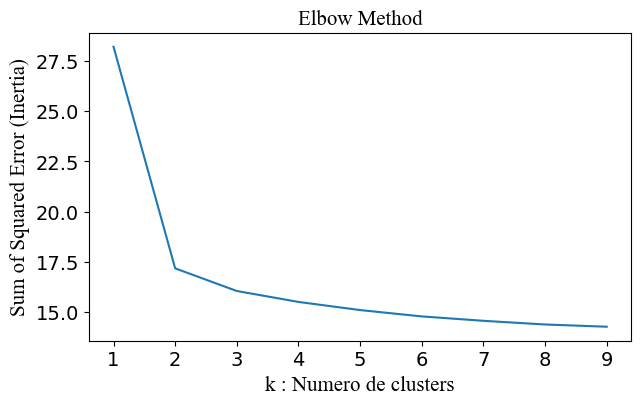

c:\Users\oscar\anaconda3\envs\all-in-purpose\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\oscar\anaconda3\envs\all-in-purpose\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\oscar\anaconda3\envs\all-in-purpose\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\oscar\anaconda3\envs\all-in-purpose\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The 

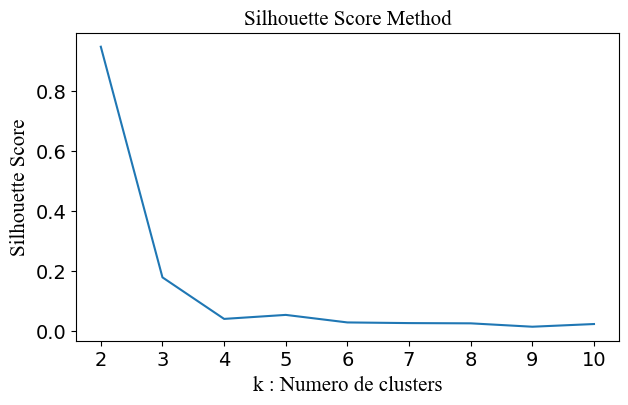

In [18]:
#Find the best number of clusters
def plot_cluster_metrics(data, kmax=10):
    """
    Plots the cluster metrics (Sum of Squared Error and Silhouette Score) for different values of k.

    Parameters:
    - data: The input data for clustering. Works with data frames and arrays.
    - kmax: The maximum number of clusters to consider.

    Returns:
    None
    """
    font = {'family': 'Times New Roman', 'size': 15, 'weight': 'normal'}
    sse = {}
    sil = []

    # Elbow Method
    fig1, ax1 = plt.subplots(figsize=(7, 4))
    ax1.set_title('Elbow Method', fontdict=font)
    for k in range(1, kmax):
        kmeans = KMeans(n_clusters=k, max_iter=100).fit(data)
        sse[k] = kmeans.inertia_
    sns.lineplot(x=list(sse.keys()), y=list(sse.values()), ax=ax1)
    ax1.set_xlabel("k : Numero de clusters", fontdict=font)
    ax1.set_ylabel("Sum of Squared Error (Inertia)", fontdict=font)
    ax1.tick_params(axis='both', labelsize=14)
    plt.show()

    # Silhouette Score Method
    fig2, ax2 = plt.subplots(figsize=(7, 4))
    ax2.set_title('Silhouette Score Method', fontdict=font)
    for k in range(2, kmax + 1):
        kmeans = KMeans(n_clusters=k).fit(data)
        labels = kmeans.labels_
        sil.append(silhouette_score(data, labels, metric='euclidean'))
    sns.lineplot(x=range(2, kmax + 1), y=sil, ax=ax2)
    ax2.set_xlabel("k : Numero de clusters", fontdict=font)
    ax2.set_ylabel("Silhouette Score", fontdict=font)
    ax2.tick_params(axis='both', labelsize=14)
    plt.show()


# Call the function with your data
plot_cluster_metrics(frecuencies, kmax=10)

### 3.3)Aplicando kmeans con distancia euclidiana

In [19]:
# Define the number of clusters
n_clusters = 5 

# Initialize KMeans model
kmeans = KMeans(n_clusters=n_clusters, random_state=0)

# Fit KMeans model to the data
kmeans.fit(X)
labels = kmeans.labels_

# Get cluster labels for each user
cluster_labels_dict = hour_dict.copy()
for user, histogram in hour_freq_dict.items():
    cluster_labels_dict[user] = kmeans.predict([histogram])[0]#solo cluster y usuario TRUST

# El problema con el siguente es que es posible que la asignacion del cluster no este bien, parece que se hace con el mismo orden
hour_dict_with_clabels = hour_dict.copy()
for i, user_id in enumerate(hour_dict_with_clabels.keys()):
    hour_dict_with_clabels[user_id] = (hour_dict_with_clabels[user_id], labels[i])
#each user ID key is associated with a tuple of the form (user_array, cluster_label), where user_array is the array of 
# hours and cluster_label is the cluster label assigned to the user.

cluster_counts = Counter(cluster_labels_dict.values())
print('El nuemro de usuarios por cluster es:', cluster_counts)

c:\Users\oscar\anaconda3\envs\all-in-purpose\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


El nuemro de usuarios por cluster es: Counter({0: 625, 3: 223, 4: 170, 1: 64, 2: 1})


In [20]:
# Extract the cluster labels from the tuples in the dictionary values
cluster_labels = [value[1] for value in hour_dict_with_clabels.values()]

# Count the cluster labels
cluster_counts = Counter(cluster_labels)

print('El nuemro de usuarios por cluster es:', cluster_counts)

El nuemro de usuarios por cluster es: Counter({0: 625, 3: 223, 4: 170, 1: 64, 2: 1})


Comprobando los clusters de los usuarios:

In [21]:
# Iterate over the keys of d1 (assuming the keys are the users)
for user in cluster_labels_dict:
    # Check if the user exists in d2
    if user in hour_dict_with_clabels:
        # Compare the group numbers associated with the user
        group_number_d1 = cluster_labels_dict[user]
        group_number_d2 = hour_dict_with_clabels[user][1]  # Assuming the group number is in the second element of the tuple
        if group_number_d1 != group_number_d2:
            # Print an error message if the group numbers are different
            print(f"Error: Group numbers for user {user} are different between d1 and d2")
            break
        else:
            print(f"User {user} is in the same group in d1 and d2")


User 470 is in the same group in d1 and d2
User 979 is in the same group in d1 and d2
User 69 is in the same group in d1 and d2
User 395 is in the same group in d1 and d2
User 87 is in the same group in d1 and d2
User 484 is in the same group in d1 and d2
User 642 is in the same group in d1 and d2
User 292 is in the same group in d1 and d2
User 428 is in the same group in d1 and d2
User 877 is in the same group in d1 and d2
User 625 is in the same group in d1 and d2
User 691 is in the same group in d1 and d2
User 116 is in the same group in d1 and d2
User 931 is in the same group in d1 and d2
User 53 is in the same group in d1 and d2
User 445 is in the same group in d1 and d2
User 135 is in the same group in d1 and d2
User 895 is in the same group in d1 and d2
User 704 is in the same group in d1 and d2
User 891 is in the same group in d1 and d2
User 284 is in the same group in d1 and d2
User 901 is in the same group in d1 and d2
User 803 is in the same group in d1 and d2
User 699 is in

In [22]:
combined_dict = {}

for user in hour_dict:
    # Check if the user exists in both dictionaries
    if user in cluster_labels_dict:
        # Combine the array of values from dic1 and the code from dic2
        combined_dict[user] = {'array': hour_dict[user], 'cluster': cluster_labels_dict[user]}

In [23]:
combined_dict

{'470': {'array': array([ 18.01666667,  18.        ,   1.03333333,   1.73333333,
           7.16666667,   7.16666667,  11.76666667,  12.58333333,
          12.6       ,  12.61666667,  12.65      ,  12.65      ,
          12.66666667,  18.        ,  18.        ,  18.        ,
          42.        ,  47.6       ,  47.76666667,  47.78333333,
          47.78333333,  47.8       ,  47.8       ,  47.85      ,
          47.86666667,  47.86666667,  48.        ,  48.16666667,
          48.2       ,  48.21666667,  48.21666667,  48.23333333,
          48.3       ,  48.31666667,  50.26666667,  50.28333333,
          50.28333333,  50.3       ,  50.3       ,  50.31666667,
          50.33333333,  53.03333333,  53.05      ,  53.3       ,
          53.78333333,  66.        ,  80.16666667,  80.18333333,
          80.18333333,  80.2       ,  80.21666667,  80.65      ,
          80.65      ,  80.86666667,  80.88333333,  80.9       ,
          80.91666667,  80.91666667,  81.        ,  81.03333333,
         

### 3.4)Graficando los clusters:

In [24]:
# Select 5 random users for each cluster
random_users = {}
for cluster in range(n_clusters):  # range is the number of clusters
    users_in_cluster = [user for user, (user_array, cluster_label) in hour_dict_with_clabels.items() if cluster_label == cluster]
    if len(users_in_cluster) >= 5:
        random_users[cluster] = random.sample(users_in_cluster, 5)
    else:
        random_users[cluster] = users_in_cluster  
        

In [25]:
random_users

{0: ['363', '535', '980', '21', '526'],
 1: ['1060', '514', '859', '567', '207'],
 2: ['587'],
 3: ['46', '995', '315', '1006', '696'],
 4: ['875', '740', '83', '93', '791']}

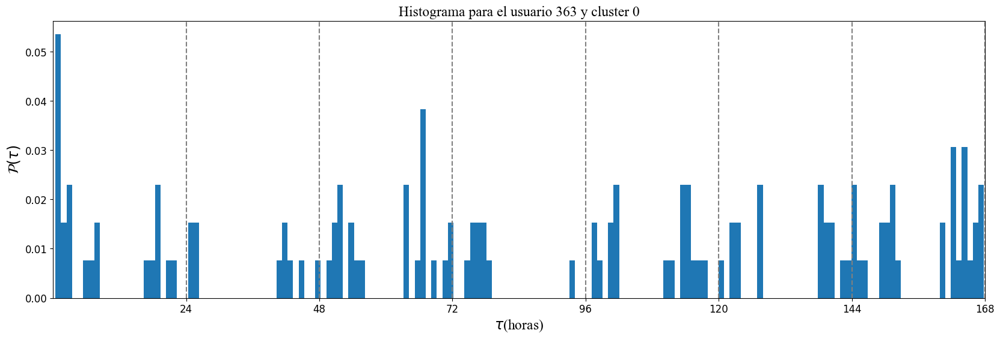

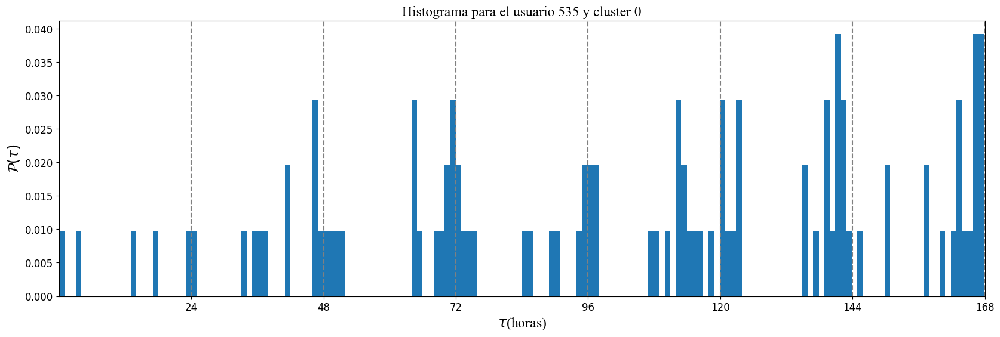

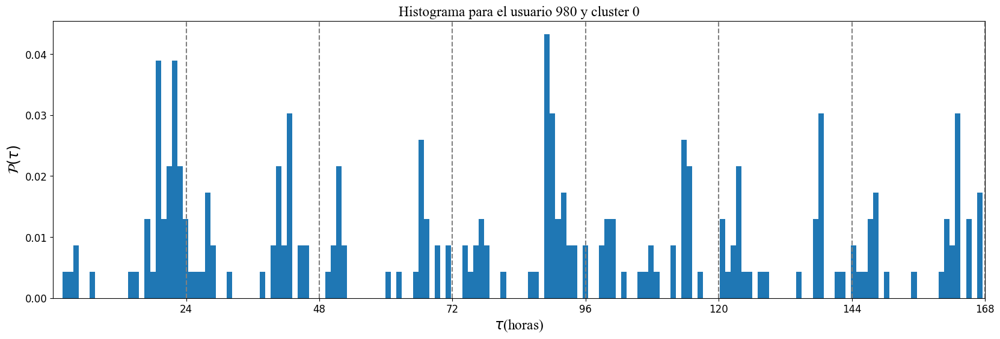

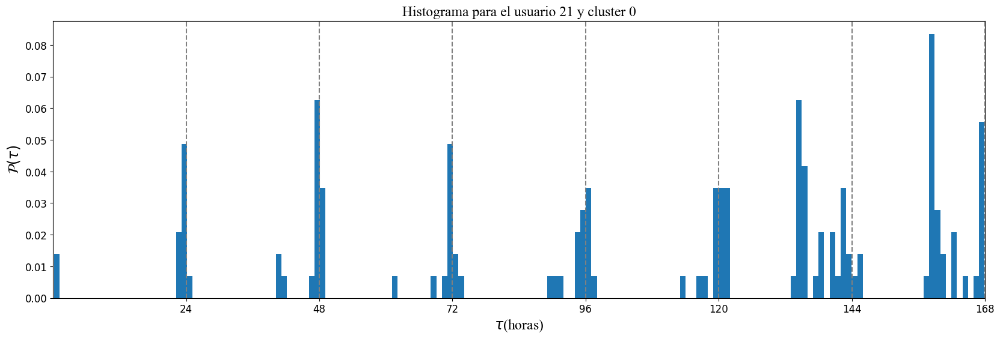

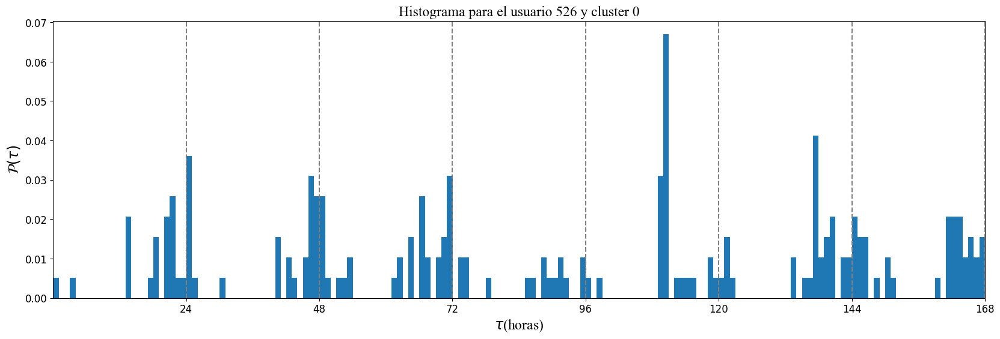

...

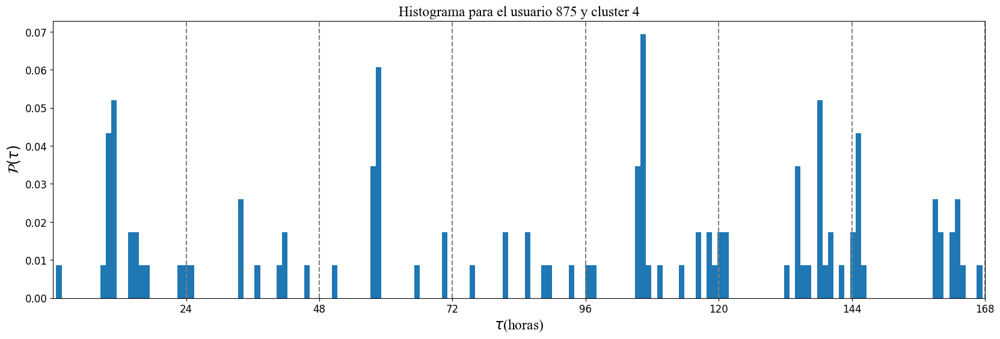

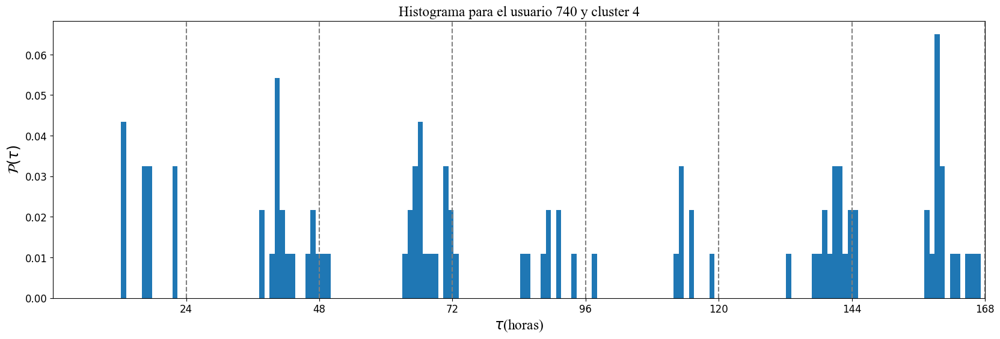

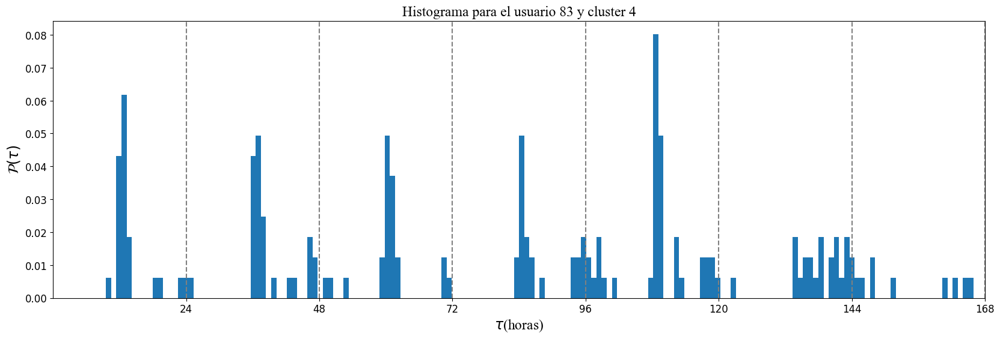

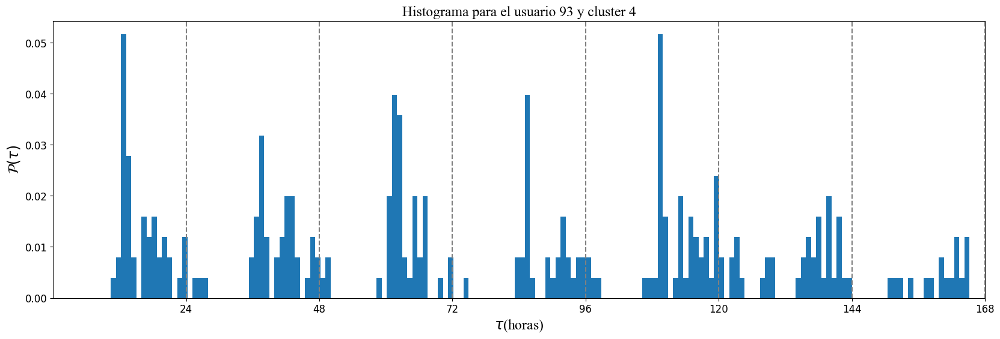

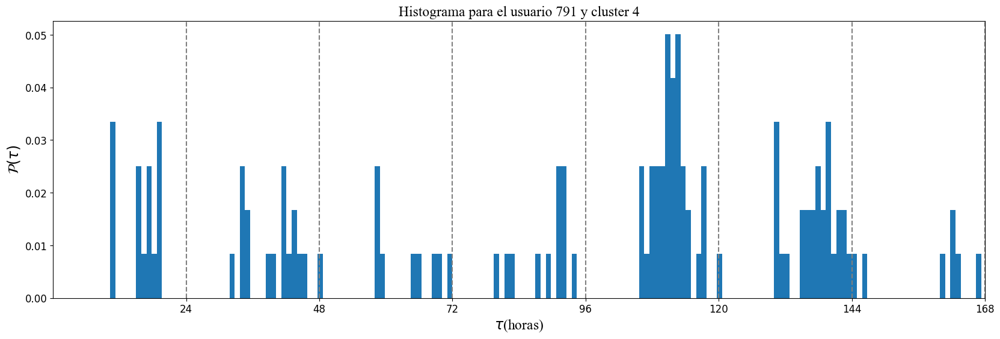

In [26]:
# Plot the hours for the selected users
for cluster, users in random_users.items():
    for user in users:
        plot_user_hours(user,cluster)

## 4)Grafica conjunta de las curvas de las frecuencias:

In [27]:

def plot_users_simple(user_dict, code):
    """
    Plot histograms for users with a given code.

    Parameters:
    - user_dict (dict): A dictionary containing user IDs as keys and their corresponding values.
    - code (str): The code to filter users.

    Returns:
    None
    """
    # Filter users with given code
    users_with_code = {user_id: values for user_id, values in user_dict.items() if values[1] == code}

    # Get the values for users with given code
    values_with_code = [values[0] for values in users_with_code.values()]

    # Plot each user's histogram
    plt.figure(figsize=(20, 6))
    for i, values in enumerate(values_with_code):
        hist, bin_edges = np.histogram(values, density=True, bins=np.arange(0,169,1))
        plt.plot(bin_edges[1::], hist, linestyle='-', color='gray')#, label=f'User {i+1}')
    
    plt.xlabel(r'$\tau$(horas)')
    plt.ylabel(r'$\rho(\tau)$')
    plt.title(f'Scatter Plot of Histo vs Bin Edges for cluster {code}')
    plt.legend()
    plt.show()

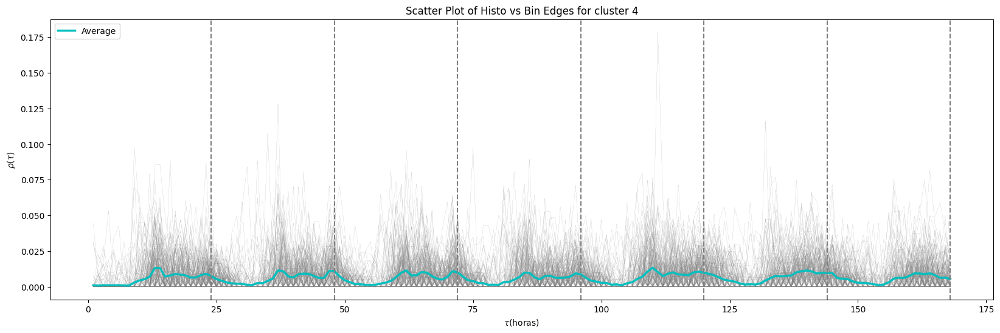

In [28]:
def plot_user(user_dict, code):
    """
    Plot histograms for users with a given code and the average histogram.

    Parameters:
    - user_dict (dict): A dictionary containing user IDs as keys and their corresponding values.
    - code (str): The code to filter users.

    Returns:
    None
    """
    # Filter users with given code
    users_with_code = {user_id: values for user_id, values in user_dict.items() if values[1] == code}

    # Get the values for users with given code
    values_with_code = [values[0] for values in users_with_code.values()]

    # Initialize list to store all histograms
    all_histograms = []

    # Plot each user's histogram and store it in the list
    plt.figure(figsize=(20, 6))
    for i, values in enumerate(values_with_code):
        hist, bin_edges = np.histogram(values, density=True, bins=np.arange(0,169,1))
        plt.plot(bin_edges[1::], hist, linestyle='-', color='gray', linewidth=0.1)#, label=f'User {i+1}')
        all_histograms.append(hist)

    # Calculate and plot the average histogram
    average_histogram = np.mean(all_histograms, axis=0)
    plt.plot(bin_edges[1::], average_histogram, linestyle='-', color='c', linewidth=2.5, label='Average')

    plt.xlabel(r'$\tau$(horas)')
    plt.ylabel(r'$\rho(\tau)$')
    plt.title(f'Scatter Plot of Histo vs Bin Edges for cluster {code}')
    plt.legend()
    #plt.ylim(0, 0.07)
    hours = [24, 48, 72, 96, 120, 144, 168]
    for hour in hours:
        plt.axvline(hour, color='gray', linestyle='--')

    plt.show()
    
plot_user(hour_dict_with_clabels, 4)

In [29]:
np.arange(0,169,1)

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
       104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
       117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
       130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
       143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
       156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168])

In [30]:
def plot_users_all_info(user_dict, codes):
    """
    Plot histograms for users with given codes and the average histogram.

    Parameters:
    - user_dict (dict): A dictionary containing user IDs as keys and their corresponding values.
    - codes (list): The codes to filter users.

    Returns:
    None
    """
    # Define a list of colors for the averages
    colors = ['c', 'm', 'y', 'g', 'r']

    # Create subplots with shared x-axis
    fig, axs = plt.subplots(len(codes), 1, figsize=(20, 6*len(codes)), sharex=True)

    for index, (ax, code, color) in enumerate(zip(axs, codes, colors)):
        # Filter users with given code
        users_with_code = {user_id: values for user_id, values in user_dict.items() if values[1] == code}

        # Get the values for users with given code
        values_with_code = [values[0] for values in users_with_code.values()]

        # Initialize list to store all histograms
        all_histograms = []
        bins=np.arange(0,169,1)

        # Plot each user's histogram and store it in the list
        for i, values in enumerate(values_with_code):
            hist, bin_edges = np.histogram(values, density=True, bins=bins)
            ax.plot(bin_edges[1::], hist, linestyle='-', color='gray', linewidth=0.1)
            all_histograms.append(hist)
            if len(bin_edges)!=169:
                print('Hay un error')
                
            print(min(bin_edges))

        
        # Calculate and plot the average histogram
        sum_of_arrays = (np.sum(all_histograms, axis=0))/len(all_histograms)
        
        average_histogram = np.mean(all_histograms, axis=0)
        if sum_of_arrays.all() == average_histogram.all():
            print('Son iguales')
            
        ax.plot(bin_edges[1::], average_histogram, linestyle='-', color=color, linewidth=2.5, label='Average')

        ax.legend(fontsize=14)

        hours = [24, 48, 72, 96, 120, 144]
        days = ['Lunes', 'Martes', 'Miercoles', 'Jueves', 'Viernes', 'Sábado', 'Domingo']
        
        for hour, day in zip(hours, days):
                ax.axvline(hour, color='gray', linestyle='--')
            
        if index == 0:  # Only add days for the first plot
            for hour, day in zip(hours, days):
                ax.axvline(hour, color='gray', linestyle='--')
                ax.text(hour - 12, 1.02, r'$\mathrm{{{}}}$'.format(day), transform=ax.get_xaxis_transform(), ha='center', va='bottom', fontsize=16)  
        # Add group symbol to the right of each plot
        ax.text(1.02, 0.5, f'$C_{code}$', transform=ax.transAxes, va='center', fontsize=20)
        
        # Set the y-axis limit for the plot of code x
        #if code == 4:
           # ax.set_ylim(0, 0.05)
           
        # Set the x-axis limit
        ax.set_xlim(0, 168)
        
        # Increase the size of the y-axis numbers
        ax.tick_params(axis='y', labelsize=14)
    
    # Set title, x-label and y-label for the entire figure
    fig.text(0.5, 0.04, r'$\tau$(horas)', ha='center',  fontsize=20)
    fig.text(0.04, 0.5, r'$\rho(\tau)$', va='center', rotation='vertical',  fontsize=20)

    # Adjust the space between the title and the top subplot, and the x-label and the bottom subplot
    fig.subplots_adjust(top=0.96, bottom=0.06, left=0.09, hspace=0.05)

    plt.show()

0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0


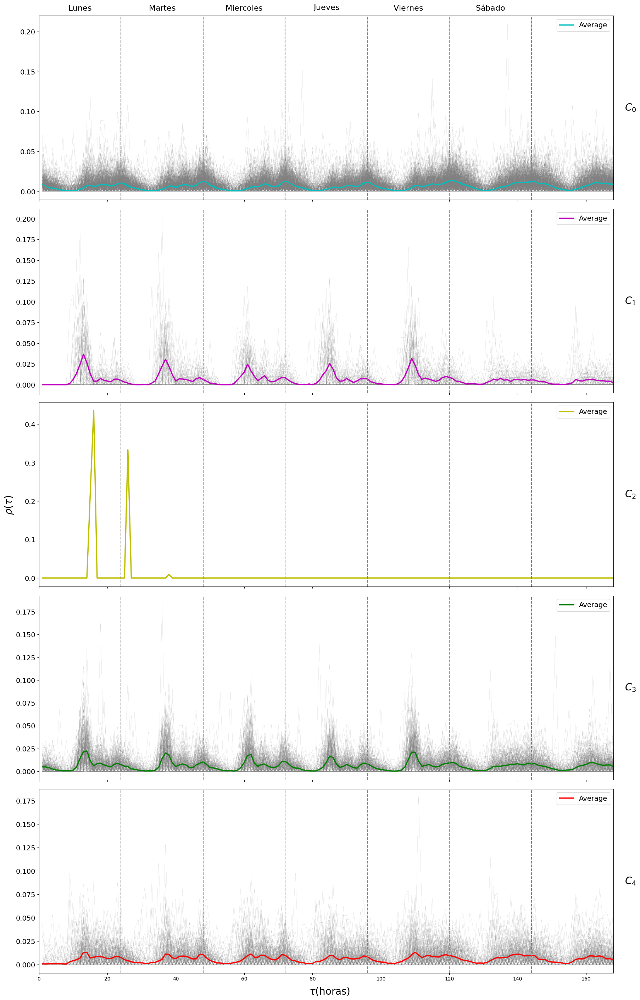

In [31]:
plot_users_all_info(hour_dict_with_clabels, [0, 1, 2, 3, 4])

In [32]:
hour_dict_with_clabels


{'470': (array([ 18.01666667,  18.        ,   1.03333333,   1.73333333,
           7.16666667,   7.16666667,  11.76666667,  12.58333333,
          12.6       ,  12.61666667,  12.65      ,  12.65      ,
          12.66666667,  18.        ,  18.        ,  18.        ,
          42.        ,  47.6       ,  47.76666667,  47.78333333,
          47.78333333,  47.8       ,  47.8       ,  47.85      ,
          47.86666667,  47.86666667,  48.        ,  48.16666667,
          48.2       ,  48.21666667,  48.21666667,  48.23333333,
          48.3       ,  48.31666667,  50.26666667,  50.28333333,
          50.28333333,  50.3       ,  50.3       ,  50.31666667,
          50.33333333,  53.03333333,  53.05      ,  53.3       ,
          53.78333333,  66.        ,  80.16666667,  80.18333333,
          80.18333333,  80.2       ,  80.21666667,  80.65      ,
          80.65      ,  80.86666667,  80.88333333,  80.9       ,
          80.91666667,  80.91666667,  81.        ,  81.03333333,
          81.05   

In [33]:

plt.rc('font', family='serif', serif='Times New Roman')

def plot_users_pretty(user_dict, codes):
    

    # Define a list of colors for the averages
    colors = ['c', 'm', 'y', 'g', 'r']

    # Create subplots with shared x-axis
    fig, axs = plt.subplots(len(codes), 1, figsize=(20, 3*len(codes)), sharex=True)

    for index, (ax, code, color) in enumerate(zip(axs, codes, colors)):
        # Filter users with given code
        users_with_code = {user_id: values for user_id, values in user_dict.items() if values[1] == code}

        # Get the values for users with given code
        values_with_code = [values[0] for values in users_with_code.values()]

        # Initialize list to store all histograms
        all_histograms = []
        linewidths = [0.0008,0.02,0.005,0.005,0.007]
        if code==0:
            line_w=linewidths[0]
        elif code==1:
            line_w=linewidths[1]
        elif code==2:
            line_w=linewidths[2]
        elif code==3:
            line_w=linewidths[3]
        elif code==4:
            line_w=linewidths[4]

        # Plot each user's histogram and store it in the list
        for i, values in enumerate(values_with_code):
            hist, bin_edges = np.histogram(values, density=True, bins=np.arange(0,169,1))
            ax.plot(bin_edges[1::], hist, linestyle='-', color='gray', linewidth=line_w)
            all_histograms.append(hist)

        # Calculate and plot the average histogram
        average_histogram = np.mean(all_histograms, axis=0)
        ax.plot(bin_edges[1::], average_histogram, linestyle='-', color=color, linewidth=2.5, label='Promedio')
        ax.legend(fontsize=23, loc='upper right')
        
        hours = [24, 48, 72, 96, 120, 144, 168]
        days = ['Lunes', 'Martes', 'Miércoles', 'Jueves', 'Viernes', 'Sábado', 'Domingo']
        
        for hour, day in zip(hours, days):
                ax.axvline(hour, color='gray', linestyle='--')
            
        if index == 0:  # Only add days for the first plot
            for hour, day in zip(hours, days):
                ax.axvline(hour, color='gray', linestyle='--')
                ax.text(hour - 12, 1.02, day, transform=ax.get_xaxis_transform(), ha='center', va='bottom', fontsize=30)
                
        # Add group symbol to the right of each plot
        
        #ax.text(1.02, 0.5, f'$\mathcal{{C}}_{{{code}}}$', transform=ax.transAxes, va='center', fontsize=35)
        if code==0:
            ax.text(1.02, 0.5, f'$\mathcal{{C}}_{{0}}$', transform=ax.transAxes, va='center', fontsize=35)
        if code==1:
            ax.text(1.02, 0.5, f'$\mathcal{{C}}_{{1}}$', transform=ax.transAxes, va='center', fontsize=35)
        if code==3:
            ax.text(1.02, 0.5, f'$\mathcal{{C}}_{{2}}$', transform=ax.transAxes, va='center', fontsize=35)
        if code==4:
            ax.text(1.02, 0.5, f'$\mathcal{{C}}_{{3}}$', transform=ax.transAxes, va='center', fontsize=35)
        # Set the y-axis limit for the plot of code x
        if code == 0:
            ax.set_ylim(0, 0.015)
            ax.set_yticks([0, 0.012])
        elif code == 1:
            ax.set_ylim(0, 0.04)
            ax.set_yticks([0, 0.03])
        #elif code == 2:
            #ax.set_ylim(0, 0.03)
        elif code == 3:
            ax.set_ylim(0, 0.025)
            ax.set_yticks([0, 0.02])
        elif code == 4:
            ax.set_ylim(0, 0.015)
            ax.set_yticks([0, 0.012])
        
        # Set tick locations and labels for x-axis
        ax.set_xlim(0, 168)
        ax.set_xticks(hours)
        ax.set_xticklabels(hours, fontsize=12)
        # Increase the size of the axis numbers
        ax.tick_params(axis='y', labelsize=25, )
        ax.tick_params(axis='x', labelsize=25)

    # Set title, x-label and y-label for the entire figure
    fig.text(0.5, 0.04, r'$\tau$(horas)', ha='center',  fontsize=35)
    fig.text(0.04, 0.5, r'$\mathcal{P}(\tau)$', va='center', rotation='vertical',  fontsize=35)

    # Adjust the space between the title and the top subplot, and the x-label and the bottom subplot
    fig.subplots_adjust(top=0.96, bottom=0.1, left=0.1, hspace=0.15)
    plt.show()
    
#Puede mejorarse las sombras y la cuestion de los promedios 

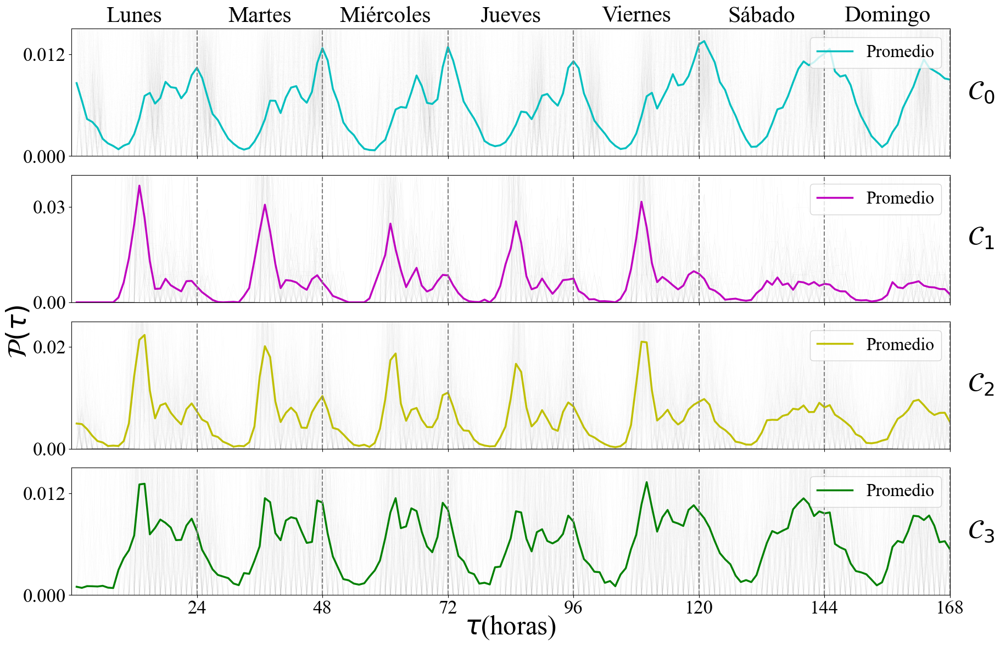

In [34]:
plot_users_pretty(hour_dict_with_clabels, [0, 1, 3, 4])

 i have a dictionary, the keys are users id and the values are a tuple with an array of values and a code, i wnat to use np.histogram and graph all the frecuencies vs the bin_edges for the users that belong to the code '5' make a code

## 5)Divergencia de Jenssen Shannon para todos los usuarios:


### 5.1) Funciones

In [35]:
def D_KL(prob_P,prob_Q,binsize):
    out = 0
    for i in range(len(prob_P)):
        if prob_P[i] != 0 and prob_Q[i] != 0:
                out += prob_P[i] * (np.log(prob_P[i]) - np.log(prob_Q[i]))
    return out*binsize#se necsita por venir de un histograma?

In [36]:
def D_JS(prob_P,prob_Q,binsize):
    prob_M=0.5*(prob_P+prob_Q)
    dist=0.5*(D_KL(prob_P,prob_M,binsize)+D_KL(prob_Q,prob_M,binsize))
    return dist

In [37]:


def plot_continuous_histo(X, binL, start):
    # Create a new figure for the plot with specified size and background color
    fig = plt.figure(figsize=(6,4), facecolor='white')

    # Loop over the range of values in X with a step size of 5
    for ss in range(start, len(X), 5):
        # Calculate the histogram of the subset of X
        counts, base = np.histogram(X[0:ss], bins=binL, density=True)
        # Plot the histogram
        plt.plot(base[1::], counts, '-', linewidth=0.5)

    # Calculate the histogram of the entire X
    counts, base = np.histogram(X, bins=binL, density=True)
    
    #verificacion, accounts for the discretization of the probability distributions as histograms and accurately reflects the differences between the distributions within each bin.
    binsize=(base[1]-base[0])
    print('this must be 1:', sum(counts)*binsize)
    
    # Plot the histogram as a dashed line
    plt.plot(base[1::], counts, 'k--', linewidth=2, label='Histograma Completo')

    font = {'family': 'Times New Roman', 'size': 15, 'weight': 'normal'}
    font1 = {'family': 'Times New Roman', 'size': 15, 'weight': 'normal'}
    font_l = {'family': 'Times New Roman', 'size': 12, 'weight': 'normal'}
    
    plt.xlabel(r'$\tau$(horas)', fontdict=font)
    plt.ylabel(r'$\mathcal{P}(\tau)$', fontdict=font)
    plt.title('Usuario 293', fontdict=font)
    # Set the font size of the tick labels on the y-axis
    plt.yticks(size=14)
    # Set the font size of the tick labels on the x-axis
    plt.xticks(size=14)
    
    rainbow_line = mlines.Line2D([], [], color='palevioletred', linestyle='-', linewidth=1, markersize=15, label='Histograma incremental')
    black_line = mlines.Line2D([], [], color='black', linestyle='--', markersize=15, label='Histograma completo')
    
    # Plot the black line
    plt.legend(handles=[rainbow_line, black_line], prop=font_l)
    
    plt.show()



In [38]:
plt.rc('font', family='serif', serif='Times New Roman')
def plot_js_divergence(X, binL, start):
    fig = plt.figure(figsize=(6,4), facecolor='white')
    # Initialize empty lists to store values
    D_JSlist=[]
    N_list=[]

    # Calculate the histogram of the entire X
    counts_total, base_total = np.histogram(X, bins=binL, density=True)

    # Calculate the size of each bin
    binsize = (base_total[1] - base_total[0])

    # Print the sum of counts_total multiplied by binsize
    print(sum(counts_total) * binsize)

    # Loop over a range of values in X
    for ss in range(start, len(X), 1):
        # Calculate the histogram of the subset of X
        counts, base = np.histogram(X[0:ss], bins=binL, density=True)

        # Calculate the Jensen-Shannon divergence between counts_total and counts
        D_JSlist.append(D_JS(counts_total, counts, binsize))

        # Append the value of ss to N_list
        N_list.append(ss)

    # Plot the Jensen-Shannon divergence as a function of the number of samples
    
    plt.plot(N_list, D_JSlist, 'k-')
    plt.xlabel(r'$n$', size=15)
    plt.ylabel(r'$\mathcal{D}_{\mathrm{JS}}(\mathcal{P},\mathcal{P}_n)$', size=15)
    plt.title('Divergencia de Jensen-Shannon', size=15)
    plt.yticks(size=14)
    plt.xticks(size=14)   
    
    plt.show()

#figure label: 

### 5.2) For a single user

{0: ['457', '21', '520', '930', '925'],
 1: ['45', '356', '1000', '813', '128'],
 2: ['587'],
 3: ['683', '900', '240', '1041', '137'],
 4: ['391', '130', '97', '323', '630']}

this must be 1: 1.0000000000000007


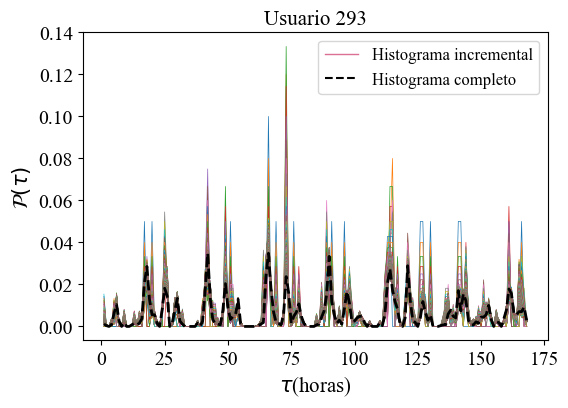

1.0000000000000007


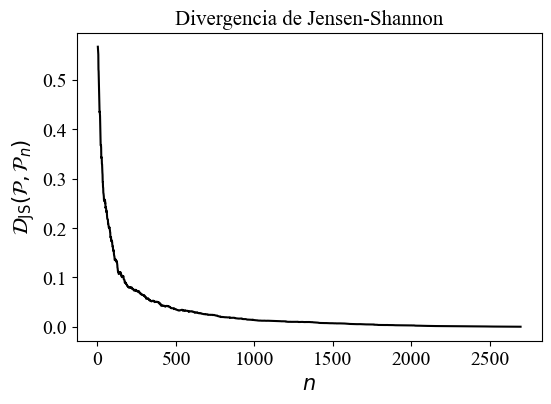

In [39]:
user_id = '293'
arreglo = hour_dict_with_clabels[user_id][0]#accedo al arreglo de ese usuario
#np.random.seed(45) 
arreglo_random = np.random.permutation(arreglo)#permuta el arreglo de manera aleatoria
plot_continuous_histo(arreglo_random, np.arange(0,169,1), 20)
plot_js_divergence(arreglo_random, np.arange(0,169,1), 5)

### 5.3) Criterio siendo DJS<=0.1:

In [40]:
plt.rc('font', family='serif', serif='Times New Roman')
def plot_js_divergence_with_criteria(dict,user, binL, start, criterio):
    user_id = user
    arreglo = dict[user_id][0]#accedo al arreglo de ese usuario
    X = np.random.permutation(arreglo)
    # Initialize empty lists to store values
    D_JSlist=[]
    N_list=[]
    X_subset = None  # Initialize a variable to store the subset of X

    # Calculate the histogram of the entire X
    counts_total, base_total = np.histogram(X, bins=binL, density=True)

    # Calculate the size of each bin
    binsize = (base_total[1] - base_total[0])

    # Loop over a range of values in X
    for ss in range(start, len(X), 1):
        # Calculate the histogram of the subset of X
        counts, base = np.histogram(X[0:ss], bins=binL, density=True)

        # Calculate the Jensen-Shannon divergence between counts_total and counts
        D_JS_value=D_JS(counts_total, counts, binsize)
        D_JSlist.append(D_JS_value)

        # Append the value of ss to N_list
        N_list.append(ss)
        
        # If D_JS is equal to or lower than 0.1, store the subset of X and break the loop
        if D_JS_value <= criterio:
            print(f"The corresponding N_list value when D_JSlist is equal to or lower than {criterio} is: {ss} out of {len(X)}")
            X_subset = X[0:ss]
            break

    # If a subset of X was stored, plot the histograms of the entire X and the subset
    if X_subset is not None:
        # Create a new figure for the plot with specified size and background color
        fig = plt.figure(figsize=(10,4), facecolor='white')

        # Calculate the histogram of the subset of X
        counts, base = np.histogram(X_subset, bins=binL, density=True)
        # Plot the histogram
        plt.plot(base[1::], counts, '-', linewidth=1, label=f'Con {len(X_subset)} check-ins $\mathcal{{D}}_{{\mathrm{{JS}}}}(\mathcal{{P}},\mathcal{{P}}_n)$={criterio}')

        # Calculate the histogram of the entire X
        counts, base = np.histogram(X, bins=binL, density=True)
        
        #verificacion
        binsize=(base[1]-base[0])
        print('this must be 1:', sum(counts)*binsize)
        
        # Plot the histogram as a dashed line
        plt.plot(base[1::], counts, 'k--', linewidth=2, label=f'Todos los {len(X)} check-ins')

        # Set the label for the x-axis
        plt.xlabel(r'$\tau$(horas)', size=15)
        # Set the label for the y-axis
        plt.ylabel(r'$\mathcal{P}(\tau)$', size=15)
        plt.title(f'Usuario {user_id} Cluster {dict[user_id][1]}', size=15)

        # Set the font size of the tick labels on the y-axis
        plt.yticks(size=14)
        # Set the font size of the tick labels on the x-axis
        plt.xticks(size=14)
        font_l = {'family': 'Times New Roman', 'size': 13, 'weight': 'normal'}
        plt.legend(prop=font_l)
        plt.show()


The corresponding N_list value when D_JSlist is equal to or lower than 0.1 is: 175 out of 2697
this must be 1: 1.0000000000000007


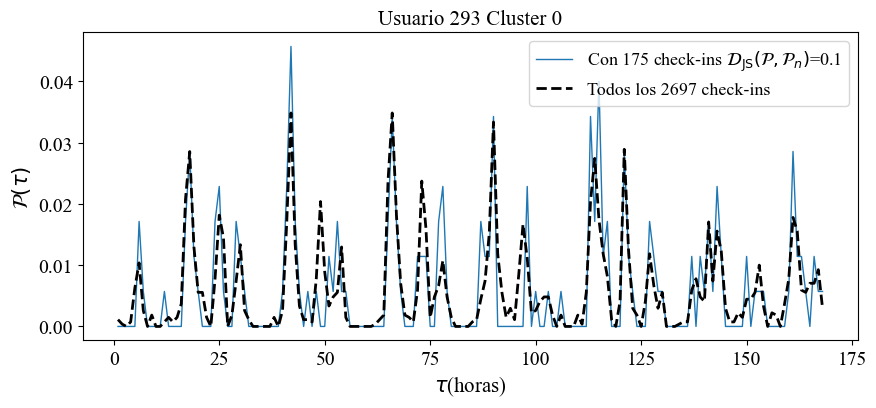

In [41]:
plot_js_divergence_with_criteria(hour_dict_with_clabels,'293', np.arange(0,169,1), 5, 0.1)

#### Graficando los random:

In [42]:
random_users

{0: ['363', '535', '980', '21', '526'],
 1: ['1060', '514', '859', '567', '207'],
 2: ['587'],
 3: ['46', '995', '315', '1006', '696'],
 4: ['875', '740', '83', '93', '791']}

The corresponding N_list value when D_JSlist is equal to or lower than 0.1 is: 71 out of 131
this must be 1: 1.000000000000001


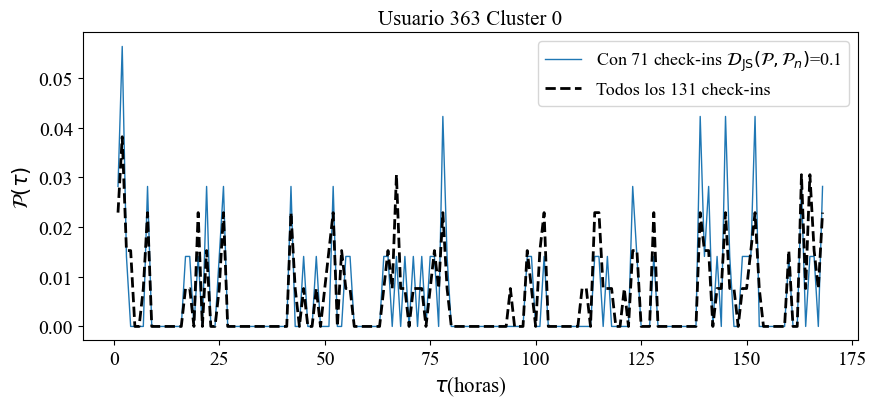

The corresponding N_list value when D_JSlist is equal to or lower than 0.1 is: 53 out of 102
this must be 1: 0.9999999999999996


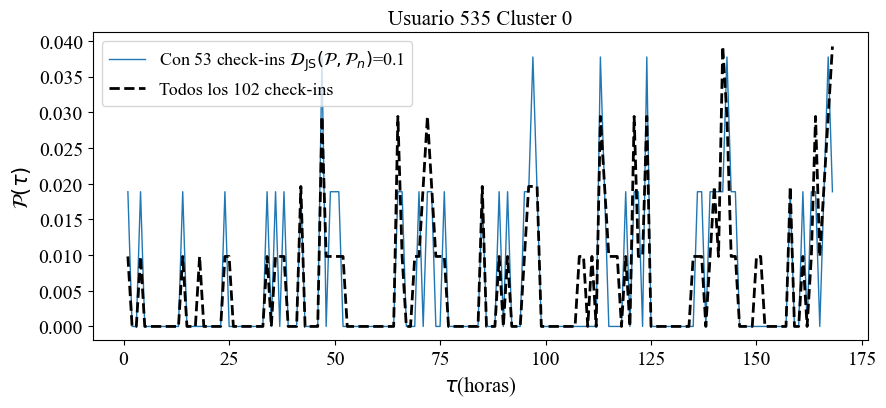

The corresponding N_list value when D_JSlist is equal to or lower than 0.1 is: 106 out of 234
this must be 1: 0.9999999999999992


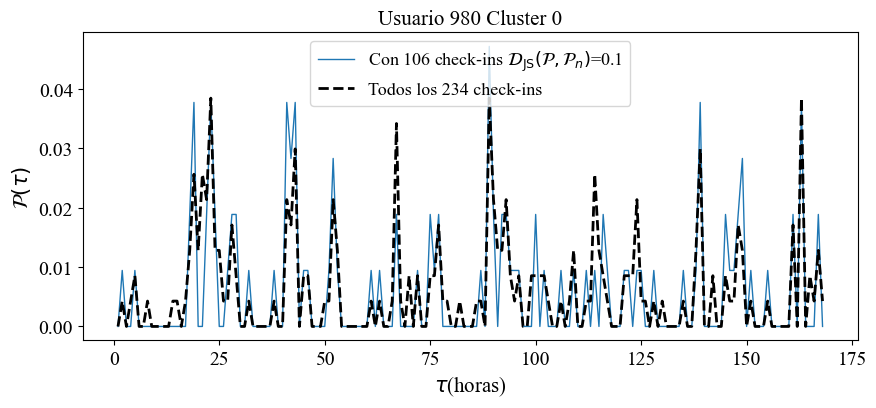

The corresponding N_list value when D_JSlist is equal to or lower than 0.1 is: 53 out of 144
this must be 1: 0.9999999999999994


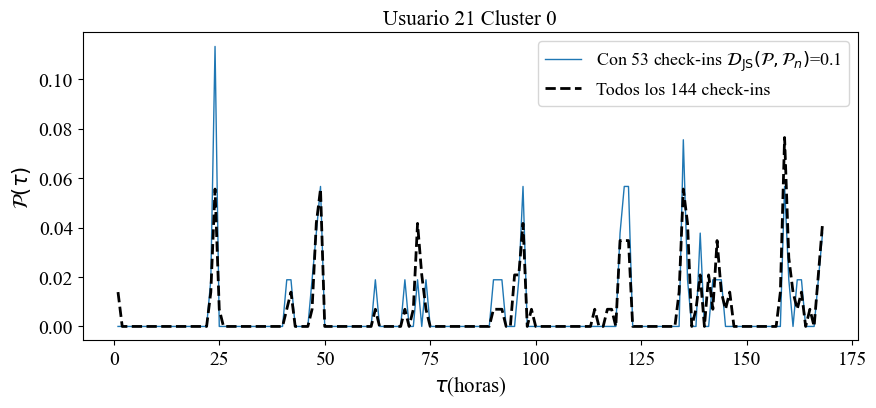

The corresponding N_list value when D_JSlist is equal to or lower than 0.1 is: 93 out of 194
this must be 1: 0.9999999999999996


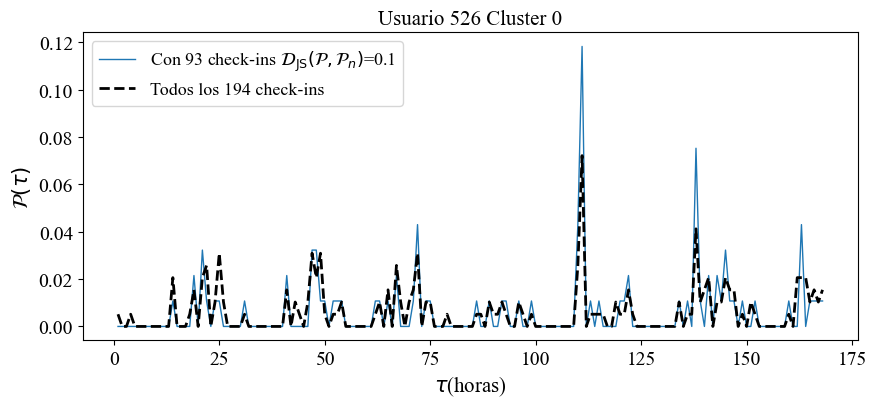

The corresponding N_list value when D_JSlist is equal to or lower than 0.1 is: 39 out of 121
this must be 1: 0.9999999999999997


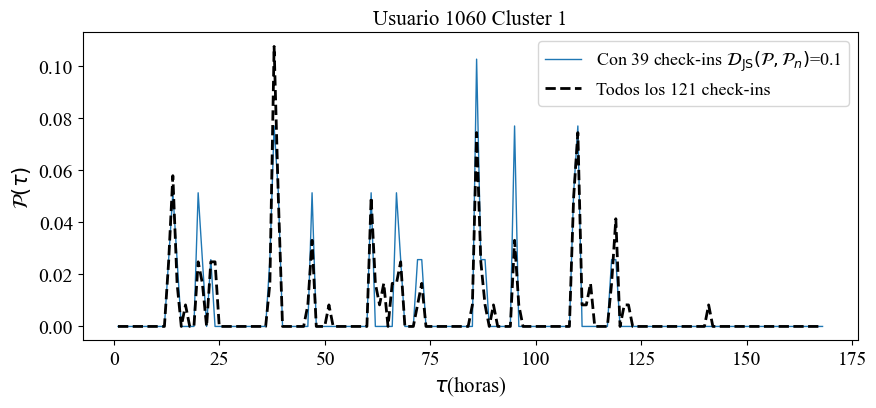

The corresponding N_list value when D_JSlist is equal to or lower than 0.1 is: 45 out of 137
this must be 1: 0.9999999999999997


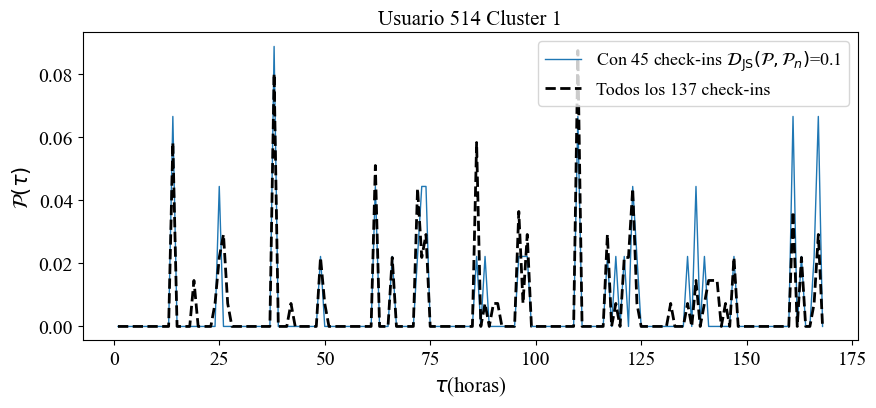

The corresponding N_list value when D_JSlist is equal to or lower than 0.1 is: 53 out of 140
this must be 1: 0.9999999999999993


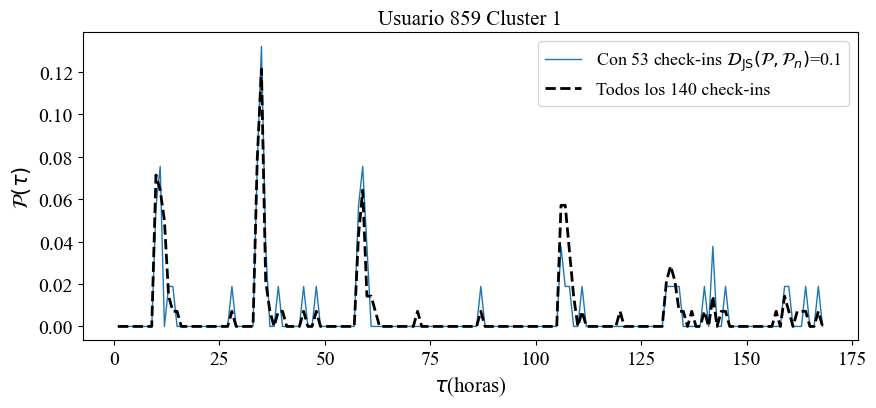

The corresponding N_list value when D_JSlist is equal to or lower than 0.1 is: 29 out of 138
this must be 1: 1.0


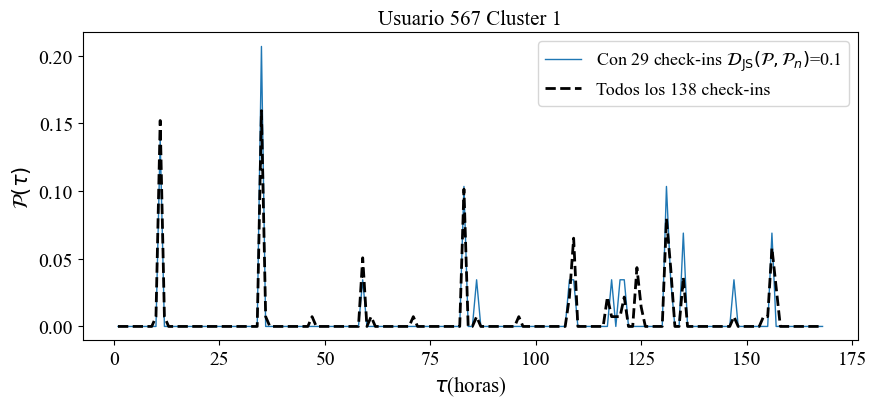

The corresponding N_list value when D_JSlist is equal to or lower than 0.1 is: 74 out of 297
this must be 1: 0.9999999999999993


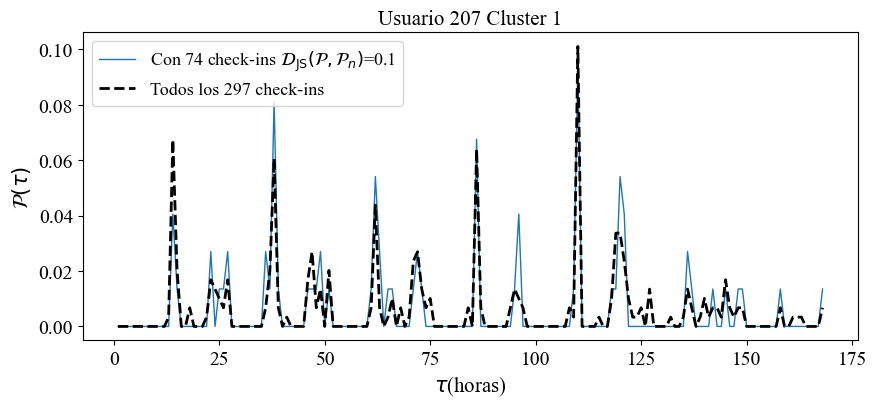

The corresponding N_list value when D_JSlist is equal to or lower than 0.1 is: 5 out of 108
this must be 1: 1.0


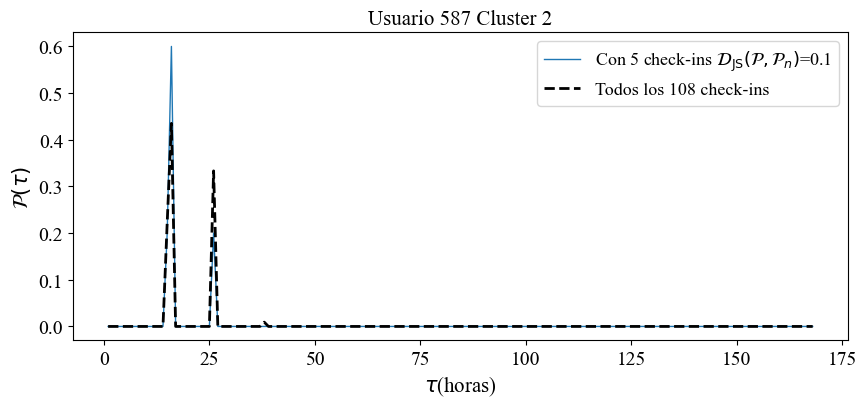

The corresponding N_list value when D_JSlist is equal to or lower than 0.1 is: 69 out of 156
this must be 1: 0.9999999999999994


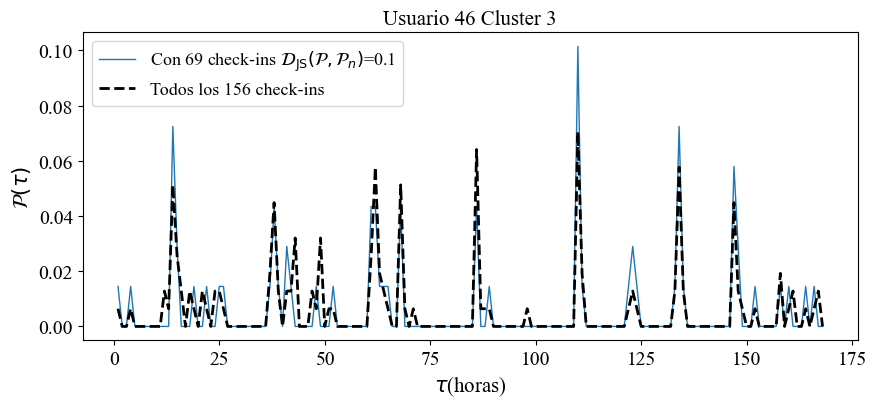

The corresponding N_list value when D_JSlist is equal to or lower than 0.1 is: 71 out of 172
this must be 1: 1.0000000000000004


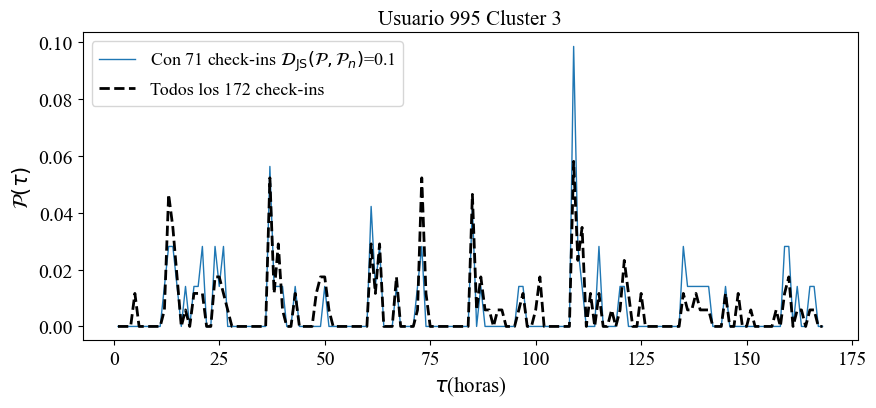

The corresponding N_list value when D_JSlist is equal to or lower than 0.1 is: 230 out of 1682
this must be 1: 1.0000000000000004


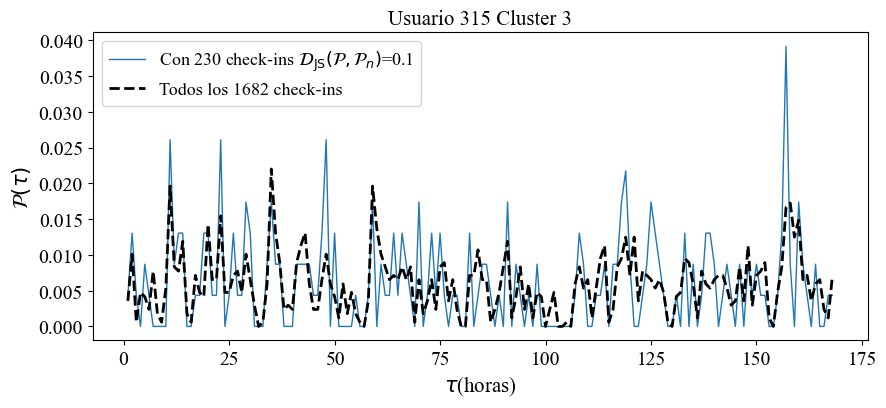

The corresponding N_list value when D_JSlist is equal to or lower than 0.1 is: 122 out of 343
this must be 1: 0.9999999999999992


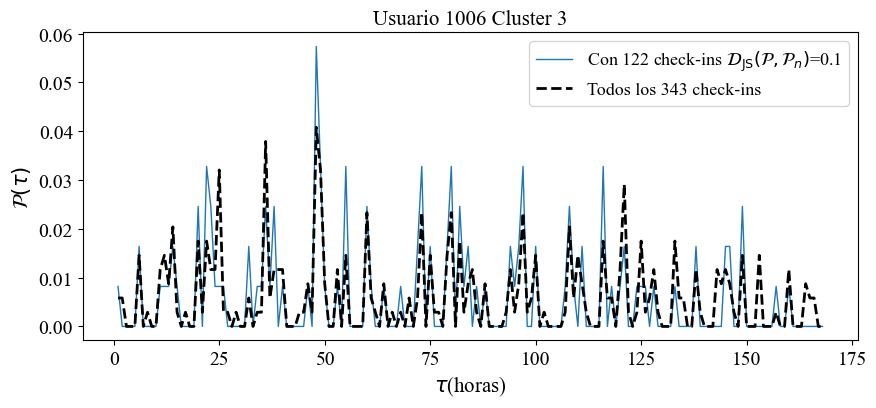

The corresponding N_list value when D_JSlist is equal to or lower than 0.1 is: 73 out of 148
this must be 1: 1.0000000000000007


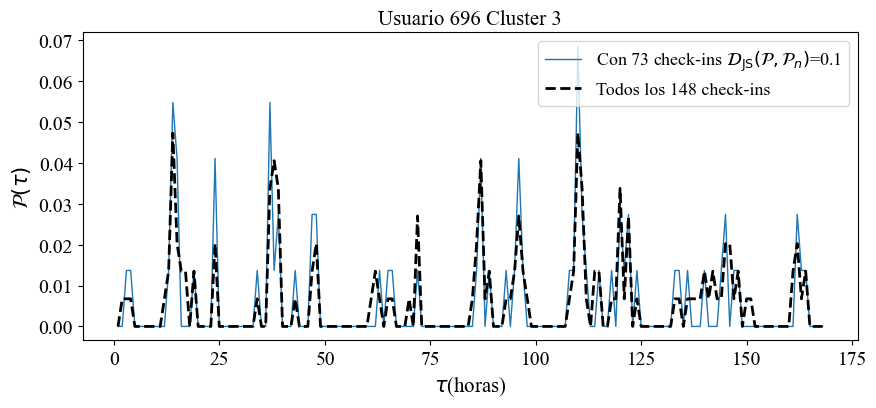

The corresponding N_list value when D_JSlist is equal to or lower than 0.1 is: 57 out of 116
this must be 1: 0.9999999999999998


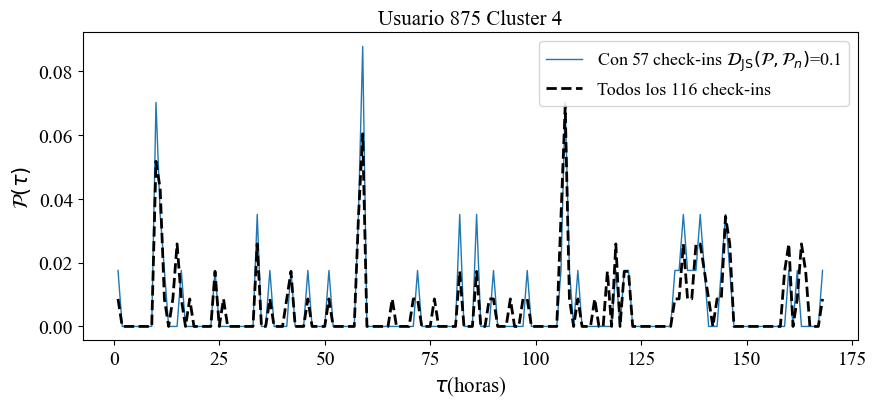

The corresponding N_list value when D_JSlist is equal to or lower than 0.1 is: 55 out of 100
this must be 1: 1.0000000000000004


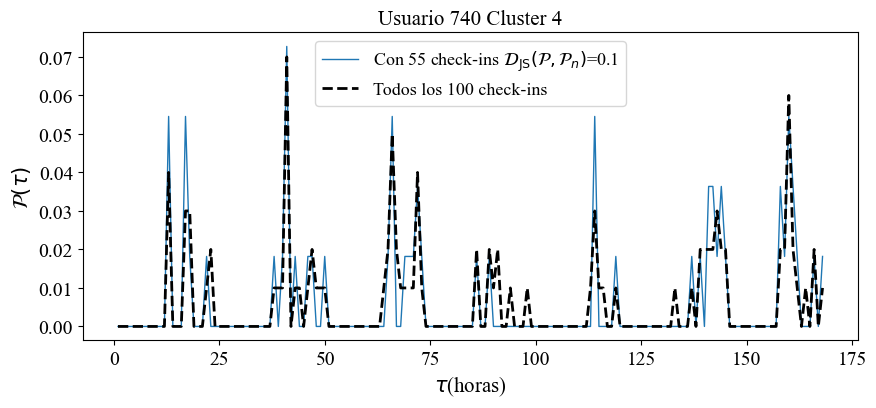

The corresponding N_list value when D_JSlist is equal to or lower than 0.1 is: 81 out of 174
this must be 1: 1.0000000000000004


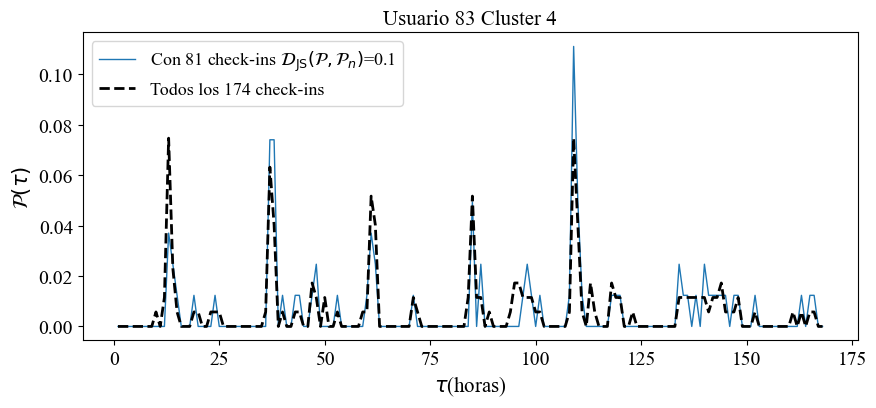

The corresponding N_list value when D_JSlist is equal to or lower than 0.1 is: 93 out of 273
this must be 1: 0.9999999999999988


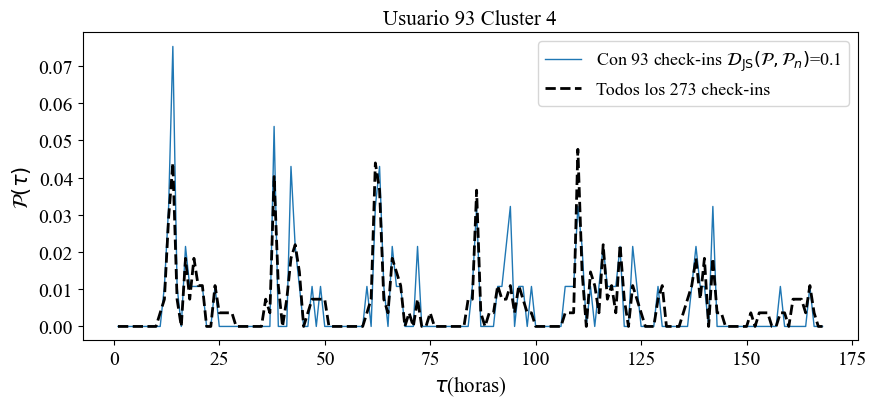

The corresponding N_list value when D_JSlist is equal to or lower than 0.1 is: 58 out of 128
this must be 1: 1.0


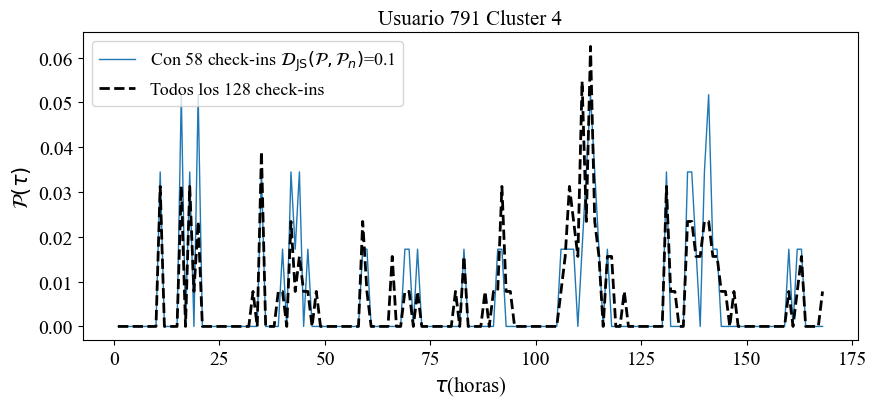

In [43]:
for cluster, users in random_users.items():
    for user in users:    
        user_id = user
        plot_js_divergence_with_criteria(hour_dict_with_clabels,user_id, np.arange(0,169,1), 5,0.1)
        
        

### 5.4)Dos criterios en uno:

In [44]:
plt.rc('font', family='serif', serif='Times New Roman')
def plot_js_divergence_with_2criteria(dict,user, binL, start, criterio1, criterio2):
    user_id = user
    arreglo = dict[user_id][0]#accedo al arreglo de ese usuario
    #np.random.seed(0)
    X = np.random.permutation(arreglo)
    # Initialize empty lists to store values
    D_JSlist_1=[]
    N_list_1=[]
    D_JSlist_2=[]
    N_list_2=[]
    X_subset = None  # Initialize a variable to store the subset of X

    # Calculate the histogram of the entire X
    counts_total, base_total = np.histogram(X, bins=binL, density=True)

    # Calculate the size of each bin
    binsize = (base_total[1] - base_total[0])

    # Create a new figure for the plot with specified size and background color
    fig = plt.figure(figsize=(10,4), facecolor='white')

    # Loop over a range of values in X
    for ss in range(start, len(X), 1):
        # Calculate the histogram of the subset of X
        counts, base = np.histogram(X[0:ss], bins=binL, density=True)

        # Calculate the Jensen-Shannon divergence between counts_total and counts
        D_JS_value=D_JS(counts_total, counts, binsize)
        D_JSlist_1.append(D_JS_value)

        # Append the value of ss to N_list_1
        N_list_1.append(ss)
        
        # If D_JS is equal to or lower than 0.1, store the subset of X and break the loop
        if D_JS_value <= criterio1:
            print(f"The corresponding N_list_1 value when D_JSlist_1 is equal to or lower than {criterio1} is: {ss} out of {len(X)}")
            X_subset = X[0:ss]
            break
        
    # If a subset of X was stored, plot the histograms of the entire X and the subset
    if X_subset is not None:
        # Calculate the histogram of the subset of X
        counts, base = np.histogram(X_subset, bins=binL, density=True)
        # Plot the histogram
        plt.plot(base[1::], counts, '-', linewidth=1, label=f'Con {len(X_subset)} check-ins $\mathcal{{D}}_{{\mathrm{{JS}}}}(\mathcal{{P}},\mathcal{{P}}_n)$={criterio1}')

    # Loop over a range of values in X
    for ss in range(start, len(X), 1):
        # Calculate the histogram of the subset of X
        counts, base = np.histogram(X[0:ss], bins=binL, density=True)

        # Calculate the Jensen-Shannon divergence between counts_total and counts
        D_JS_value=D_JS(counts_total, counts, binsize)
        D_JSlist_2.append(D_JS_value)

        # Append the value of ss to N_list_1
        N_list_2.append(ss)
        
        # If D_JS is equal to or lower than 0.01, store the subset of X and break the loop
        if D_JS_value <= criterio2:
            print(f"The corresponding N_list_1 value when D_JSlist_2 is equal to or lower than {criterio2} is: {ss} out of {len(X)}")
            X_subset = X[0:ss]
            break

    # If a subset of X was stored, plot the histograms of the entire X and the subset
    if X_subset is not None:
        # Calculate the histogram of the subset of X
        counts, base = np.histogram(X_subset, bins=binL, density=True)
        # Plot the histogram
        plt.plot(base[1::], counts, '-', linewidth=1, label=f'Con {len(X_subset)} check-ins $\mathcal{{D}}_{{\mathrm{{JS}}}}(\mathcal{{P}},\mathcal{{P}}_n)$={criterio2}')

    # Calculate the histogram of the entire X
    counts, base = np.histogram(X, bins=binL, density=True)
    
    #verificacion
    binsize=(base[1]-base[0])
    print('this must be 1:', sum(counts)*binsize)
    
    # Plot the histogram as a dashed line
    plt.plot(base[1::], counts, 'k--', linewidth=2, label=f'Todos los {len(X)} check-ins')
    plt.xlabel(r'$\tau$(horas)', size=15)
    plt.ylabel(r'$\mathcal{P}(\tau)$', size=15)
    plt.title(f'Usuario {user_id} Cluster {dict[user_id][1]}', size=15)
    plt.yticks(size=14)
    plt.xticks(size=14)
    font_l = {'family': 'Times New Roman', 'size': 13, 'weight': 'normal'}
    plt.legend(prop=font_l)
    plt.show()


The corresponding N_list_1 value when D_JSlist_1 is equal to or lower than 0.1 is: 67 out of 116
The corresponding N_list_1 value when D_JSlist_2 is equal to or lower than 0.01 is: 112 out of 116
this must be 1: 0.9999999999999996


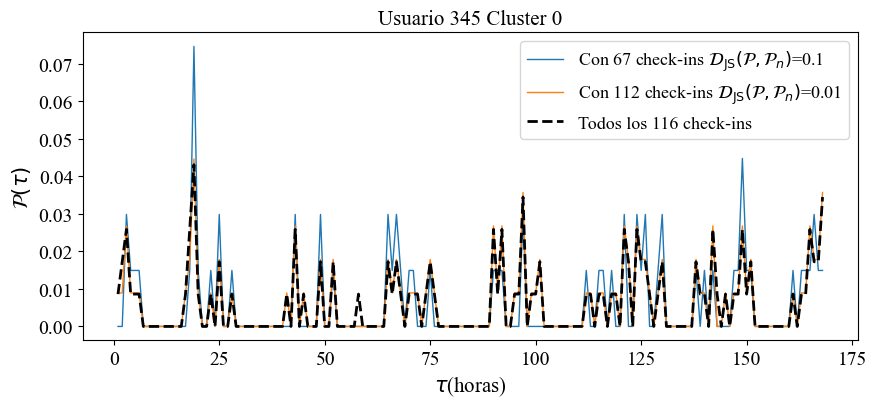

In [54]:
plot_js_divergence_with_2criteria(hour_dict_with_clabels,'345', np.arange(0,169,1), 5, 0.1, 0.01)

### 5.5)Mirando las fraciones de los check-ins

In [46]:
def js_divergence_fraction(dict,user, binL, start, criterio1, criterio2):
    user_id = user
    arreglo = dict[user_id][0]#accedo al arreglo de ese usuario
    np.random.seed(0)
    X = np.random.permutation(arreglo)
    # Initialize empty lists to store values
    D_JSlist_1=[]
    N_list_1=[]
    D_JSlist_2=[]
    N_list_2=[]
    check_ins_2={}
    check_ins_1={}
    X_subset = None  # Initialize a variable to store the subset of X

    # Calculate the histogram of the entire X
    counts_total, base_total = np.histogram(X, bins=binL, density=True)

    # Calculate the size of each bin
    binsize = (base_total[1] - base_total[0])

    # Loop over a range of values in X
    for ss in range(start, len(X), 1):
        # Calculate the histogram of the subset of X
        counts, base = np.histogram(X[0:ss], bins=binL, density=True)

        # Calculate the Jensen-Shannon divergence between counts_total and counts
        D_JS_value=D_JS(counts_total, counts, binsize)
        D_JSlist_1.append(D_JS_value)

        # Append the value of ss to N_list_1
        N_list_1.append(ss)
        
        # If D_JS is equal to or lower than 0.1, store the subset of X and break the loop
        if D_JS_value <= criterio1:
            
            X_subset = X[0:ss]
            check_ins_1[user_id]=[ss+1,len(X)]
            break
        
        
        
    

    # Loop over a range of values in X
    for ss in range(start, len(X), 1):
        # Calculate the histogram of the subset of X
        counts, base = np.histogram(X[0:ss], bins=binL, density=True)

        # Calculate the Jensen-Shannon divergence between counts_total and counts
        D_JS_value=D_JS(counts_total, counts, binsize)
        D_JSlist_2.append(D_JS_value)

        # Append the value of ss to N_list_1
        N_list_2.append(ss)
        
        # If D_JS is equal to or lower than 0.01, store the subset of X and break the loop
        if D_JS_value <= criterio2:
            
            X_subset = X[0:ss]
            check_ins_2[user_id]=[ss+1,len(X)]
            break
        
        
        

    
    
    return check_ins_1, check_ins_2

In [47]:
x, y=js_divergence_fraction(hour_dict_with_clabels,'293', np.arange(0,169,1), 5, 0.1, 0.01)
print(x, y)

{'293': [153, 2697]} {'293': [1144, 2697]}


In [48]:
fracciones={}# Its a dictionary with the user as key and the fraction of the check-ins as value
for user in hour_dict_with_clabels.keys():
    
    x, y=js_divergence_fraction(hour_dict_with_clabels,user, np.arange(0,169,1), 5, 0.1, 0.01)
    #solo estoy mirando el x 
    fracction= (x[user][0]/x[user][1])
    fracciones[user]=fracction
    
    

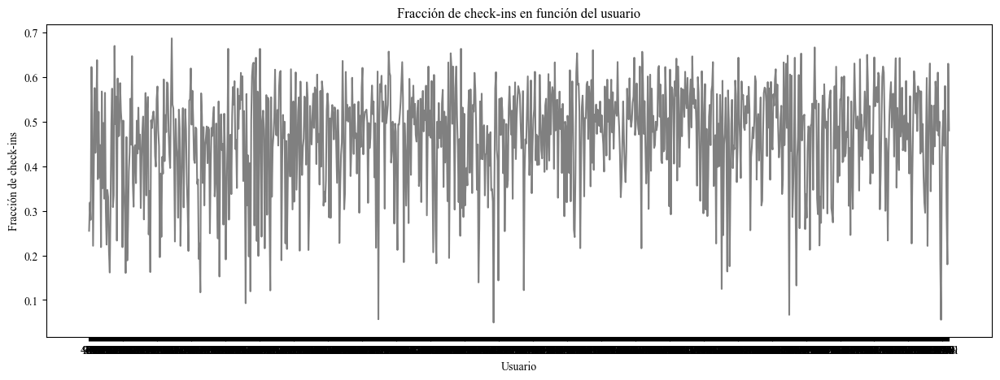

In [49]:
#plot fracciones de check-ins as a function of the user with lines
plt.figure(figsize=(15,5))
plt.plot(list(fracciones.keys()), list(fracciones.values()), '-', color='gray')
plt.xlabel('Usuario')
plt.ylabel('Fracción de check-ins')
plt.title('Fracción de check-ins en función del usuario')
plt.show()


{0: ['201', '160', '898', '955', '907'],
 1: ['966', '376', '308', '1026', '757'],
 2: ['587'],
 3: ['14', '758', '924', '380', '23'],
 4: ['391', '592', '852', '910', '605']}

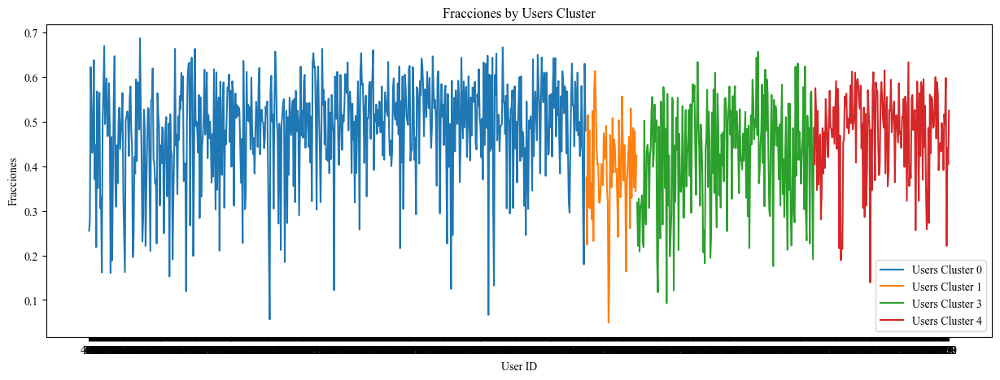

In [50]:

#Los usuarios de los custers en lista
users_cluster_0 = [user for user, cluster in fracciones.items() if hour_dict_with_clabels[user][1] == 0]
users_cluster_1 = [user for user, cluster in fracciones.items() if hour_dict_with_clabels[user][1] == 1]
users_cluster_2 = [user for user, cluster in fracciones.items() if hour_dict_with_clabels[user][1] == 2]
users_cluster_3 = [user for user, cluster in fracciones.items() if hour_dict_with_clabels[user][1] == 3]
users_cluster_4 = [user for user, cluster in fracciones.items() if hour_dict_with_clabels[user][1] == 4]
plt.figure(figsize=(15,5))
# Plot fracciones with a line for each users_cluster variable
#plt.plot(fracciones.keys(), fracciones.values(), label='All Users')
plt.plot(users_cluster_0, [fracciones[user] for user in users_cluster_0], label='Users Cluster 0')
plt.plot(users_cluster_1, [fracciones[user] for user in users_cluster_1], label='Users Cluster 1')
#plt.plot(users_cluster_2, [fracciones[user] for user in users_cluster_2], label='Users Cluster 2')
plt.plot(users_cluster_3, [fracciones[user] for user in users_cluster_3], label='Users Cluster 3')
plt.plot(users_cluster_4, [fracciones[user] for user in users_cluster_4], label='Users Cluster 4')

# Set plot title and labels
plt.title('Fracciones by Users Cluster')
plt.xlabel('User ID')
plt.ylabel('Fracciones')

# Add legend
plt.legend()

# Show the plot
plt.show()

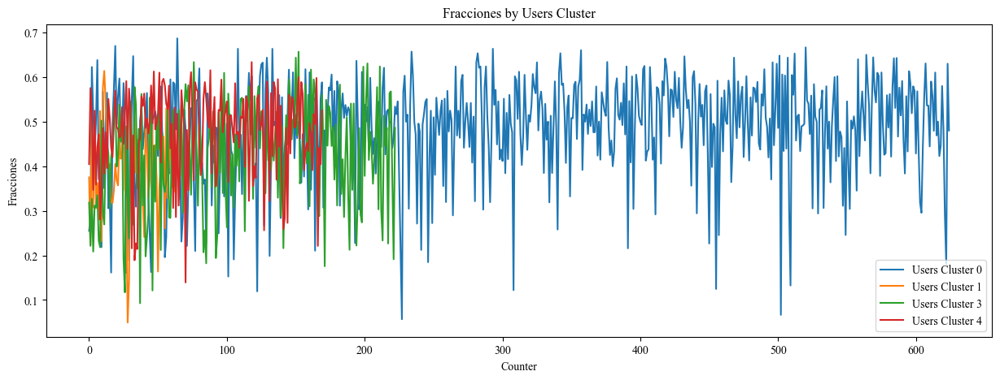

In [51]:
#Los usuarios de los custers en lista
users_cluster_0 = [user for user, cluster in fracciones.items() if hour_dict_with_clabels[user][1] == 0]
users_cluster_1 = [user for user, cluster in fracciones.items() if hour_dict_with_clabels[user][1] == 1]
users_cluster_2 = [user for user, cluster in fracciones.items() if hour_dict_with_clabels[user][1] == 2]
users_cluster_3 = [user for user, cluster in fracciones.items() if hour_dict_with_clabels[user][1] == 3]
users_cluster_4 = [user for user, cluster in fracciones.items() if hour_dict_with_clabels[user][1] == 4]

plt.figure(figsize=(15,5))

# Plot fracciones with a line for each users_cluster variable
plt.plot(range(len(users_cluster_0)), [fracciones[user] for user in users_cluster_0], label='Users Cluster 0')
plt.plot(range(len(users_cluster_1)), [fracciones[user] for user in users_cluster_1], label='Users Cluster 1')
plt.plot(range(len(users_cluster_3)), [fracciones[user] for user in users_cluster_3], label='Users Cluster 3')
plt.plot(range(len(users_cluster_4)), [fracciones[user] for user in users_cluster_4], label='Users Cluster 4')

# Set plot title and labels
plt.title('Fracciones by Users Cluster')
plt.xlabel('Counter')
plt.ylabel('Fracciones')

# Add legend
plt.legend()

# Show the plot
plt.show()

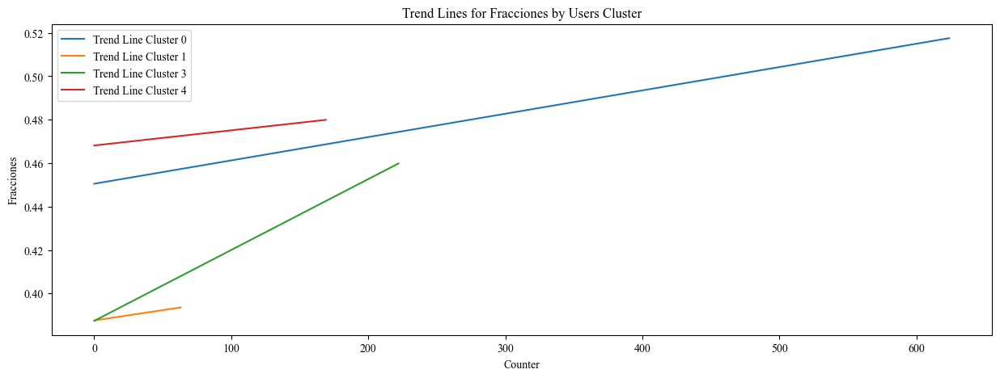

In [52]:
#Los usuarios de los custers en lista
users_cluster_0 = [user for user, cluster in fracciones.items() if hour_dict_with_clabels[user][1] == 0]
users_cluster_1 = [user for user, cluster in fracciones.items() if hour_dict_with_clabels[user][1] == 1]
users_cluster_2 = [user for user, cluster in fracciones.items() if hour_dict_with_clabels[user][1] == 2]
users_cluster_3 = [user for user, cluster in fracciones.items() if hour_dict_with_clabels[user][1] == 3]
users_cluster_4 = [user for user, cluster in fracciones.items() if hour_dict_with_clabels[user][1] == 4]

plt.figure(figsize=(15,5))

# Define a function to plot a trend line
def plot_trend_line(x_values, y_values, label):
    # Fit a line to the data
    coefficients = np.polyfit(x_values, y_values, 1)
    polynomial = np.poly1d(coefficients)
    # Generate y-values based on the fit
    y_fit = polynomial(x_values)
    # Plot the trend line
    plt.plot(x_values, y_fit, label=label)

# Plot trend lines for each users_cluster variable
plot_trend_line(range(len(users_cluster_0)), [fracciones[user] for user in users_cluster_0], 'Trend Line Cluster 0')
plot_trend_line(range(len(users_cluster_1)), [fracciones[user] for user in users_cluster_1], 'Trend Line Cluster 1')
plot_trend_line(range(len(users_cluster_3)), [fracciones[user] for user in users_cluster_3], 'Trend Line Cluster 3')
plot_trend_line(range(len(users_cluster_4)), [fracciones[user] for user in users_cluster_4], 'Trend Line Cluster 4')

# Set plot title and labels
plt.title('Trend Lines for Fracciones by Users Cluster')
plt.xlabel('Counter')
plt.ylabel('Fracciones')

# Add legend
plt.legend()

# Show the plot
plt.show()